In this notebook we will cover a demand forecasting use case from reading in the data to getting predictions from a deploymnet. <br>
Sections
1. Read in data and Exploratory Data Analysis (EDA) <br>
2. Identify Anomalous spikes
3. Cluster data
4. Run Model Factory (Iterate over various settings if desired)
5. Model Insights
6. Get predictions from Modeling workers. Used for testing
7. Deploy model and get Predictions from Deployment Server
8. Clean up - Delete deployment and projects (Primarily for Demo purposes)

In [1]:
# !pip install --upgrade datarobot
# !pip install umap-learn
# !pip install -Iv hdbscan==0.8.24
# !pip install pandas-profiling
# !pip install ipywidgets

In [5]:
""" 
API Documentation
https://datarobot-public-api-client.readthedocs-hosted.com/en/v2.24.0/index.html

DataRobot Community
https://community.datarobot.com/t5/datarobot-community/ct-p/en

"""

In [6]:
import datarobot as dr
from datarobot import Project, Deployment
import pandas as pd
from pandas.io.json import json_normalize
import numpy as np
from datetime import date, timedelta
from datetime import datetime

import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.ticker as mtick
from matplotlib.ticker import FormatStrFormatter

import datetime as dt
from datetime import datetime
import dateutil.parser
import os
import re 
from importlib import reload
import random
import math
import umap

from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from scipy.signal import savgol_filter
from pandas_profiling import ProfileReport
import ipywidgets

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Set Pandas configuration to show all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

import warnings
warnings.filterwarnings('ignore')

## Set the ranomdom state variable to be used throughout the notebook. 
This will ensure reproducability. Without this, results will change each time you run a cell. 

In [7]:
RANDOM_STATE = 1234

## Connect to DataRobot using a yaml file

In [8]:
dr.Client(config_path='../../drconfig.yaml');

# Section 1 - Read in data and get started

In [9]:
df = pd.read_csv('data/Acme_Train.csv',
                 infer_datetime_format=True,
                 parse_dates=['Date'],
                 engine='c',
                 )

# Extract Month (To be used later for Clustering)
# df['Month'] = df['date'].dt.strftime('%b')          # Month Name

# Drop columns
df.drop(labels=['Category'], axis=1, inplace=True)

df.tail(5)

,SalesQty,AvgPrice,numTransactions,Weight,Advertised,FrontPg,OnDisplay,WeekNbr,Cat,Date,Store,Item,Month,Series
340668,2.00000,4.99000,2,0.00000,0,0,0,38,Soft_Drinks,2018-09-22,1115,3722462659,September,01115_Soft_Drinks_3722462659
340669,3.00000,4.99000,3,0.00000,0,0,0,38,Soft_Drinks,2018-09-23,1115,3722462659,September,01115_Soft_Drinks_3722462659
340670,2.00000,4.99000,2,0.00000,0,0,0,39,Soft_Drinks,2018-09-24,1115,3722462659,September,01115_Soft_Drinks_3722462659
340671,0.00000,4.99000,0,0.00000,0,0,0,39,Soft_Drinks,2018-09-25,1115,3722462659,September,01115_Soft_Drinks_3722462659
340672,2.00000,4.99000,2,0.00000,0,0,0,39,Soft_Drinks,2018-09-26,1115,3722462659,September,01115_Soft_Drinks_3722462659


## Set Variables
Setting the variables here and referencing them throughout the rest of the notebook

In [10]:
SERIES_ID = 'Series'
DATE_COL  = 'Date'
TARGET    = 'SalesQty'
FREQ      = '1D'

In [11]:
print(df[DATE_COL].min())
print(df[DATE_COL].max())

2015-05-01 00:00:00
2018-09-26 00:00:00


In [12]:
STARTING_LEN = len(df)
print(STARTING_LEN)

340673


## EDA
Perform general EDA using Pandas Profiling. This will cover a lot of the EDA needed, but your specific dataset might require more EDA in certain areas. Consider this a good starting point. <br>
In the next section we will explore some Time Series focused EDA techniques.  

In [13]:
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Profile Widgets

In [14]:
# profile.to_widgets()
profile.to_notebook_iframe()

In [15]:
df.describe()

,SalesQty,AvgPrice,numTransactions,Weight,Advertised,FrontPg,OnDisplay,WeekNbr,Store,Item
count,340673.00000,340672.00000,340673.00000,340673.00000,340673.00000,340673.00000,340673.00000,340673.00000,340673.00000,340673.00000
mean,18.25370,2.31601,10.74538,0.13476,0.06288,0.01133,0.04253,26.54553,1070.68735,3419697467.94633
std,62.29762,1.88240,31.12779,0.34132,0.24275,0.10583,0.20179,14.29111,22.01660,531259407.32044
min,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1053.00000,2522464454.00000
25%,0.00000,0.89000,0.00000,0.00000,0.00000,0.00000,0.00000,15.00000,1062.00000,3476661932.00000
50%,2.00000,1.89000,1.00000,0.00000,0.00000,0.00000,0.00000,27.00000,1063.00000,3633501490.00000
75%,8.00000,2.99000,5.00000,0.00000,0.00000,0.00000,0.00000,38.00000,1064.00000,3633542162.00000
max,4136.00000,9.99000,488.00000,1.00000,1.00000,1.00000,1.00000,53.00000,1115.00000,4942462523.00000


# EDA - Time Series Focused
This section is focused on Time Series specific EDA. This section is meant to be a general starting point. Your dataset and use case might require more EDA in specific areas. 

In [16]:
# Get the total number of Series in the dataset
df[SERIES_ID].nunique()

376

## Series Statistics

In [17]:
summary = df.groupby([SERIES_ID], as_index=False).agg({
                                                  DATE_COL: ['min', 'max', 'count'],
                                                  TARGET: ['min', np.mean, 'max', 'std'],
                                                  }).reset_index(level=0, drop=True)

summary.columns = ['id', 'date_min', 'date_max', 'records', 'qty_min', 'qty_mean', 'qty_max', 'qty_std']

summary['series_Weeks'] = summary.date_max - summary.date_min 
summary['series_Weeks'] = summary['series_Weeks'] / np.timedelta64(1, 'W')

summary.sort_values(by=['qty_mean'], ascending=False)

,id,date_min,date_max,records,qty_min,qty_mean,qty_max,qty_std,series_Weeks
206,01063_Milk_Carton_3633501490,2015-05-01,2018-09-26,1157,0.00000,240.32498,497.00000,68.04933,177.71429
152,01063_Alcohol_3633522292,2015-05-01,2018-09-26,1207,0.00000,227.86413,1098.00000,123.68509,177.71429
56,01053_Milk_Carton_3633501490,2015-05-01,2018-09-26,1179,0.00000,222.44614,487.00000,68.99215,177.71429
205,01063_Meats_2522465979,2015-05-01,2018-09-26,1241,0.00000,220.06608,2626.00000,339.99525,177.71429
356,01115_Milk_Carton_3633501490,2016-01-28,2018-09-26,921,0.00000,210.61889,412.00000,63.26249,138.85714
...,...,...,...,...,...,...,...,...,...
343,01115_Fresh_Vegetables_2522464665,2016-02-14,2018-09-26,955,0.00000,0.07905,5.70000,0.43618,136.42857
239,01064_Candy_3476662347,2018-03-31,2018-09-26,180,0.00000,0.07778,2.00000,0.28862,25.57143
164,01063_Candy_3476662347,2018-03-30,2018-09-26,181,0.00000,0.04972,1.00000,0.21798,25.71429
42,01053_Fresh_Vegetables_2522464665,2015-05-02,2018-09-26,1244,0.00000,0.04731,8.73000,0.35817,177.57143


## Number of Unique Series over Time

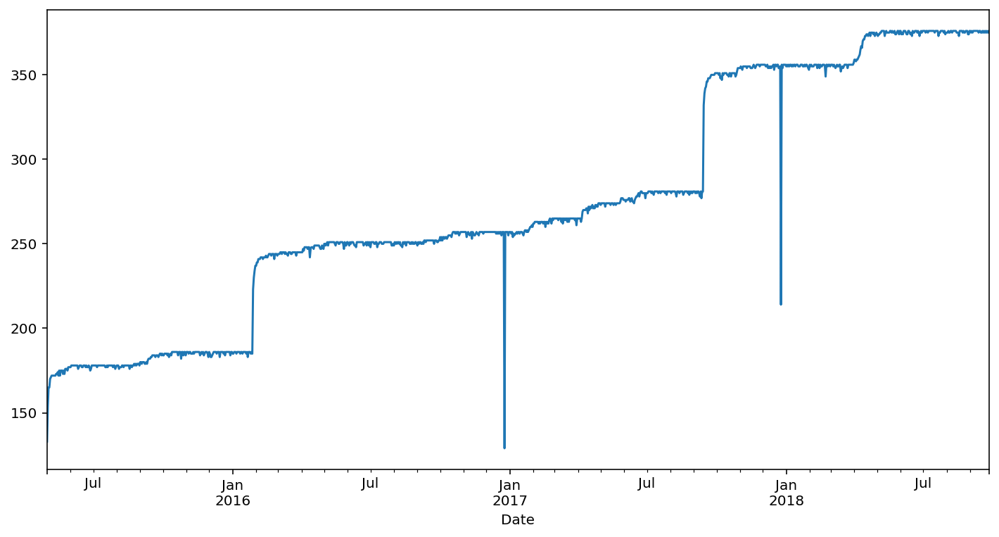

In [18]:
df.groupby([DATE_COL])[SERIES_ID].nunique().plot(figsize=(12,6));

## Target Distribution
Log Scale

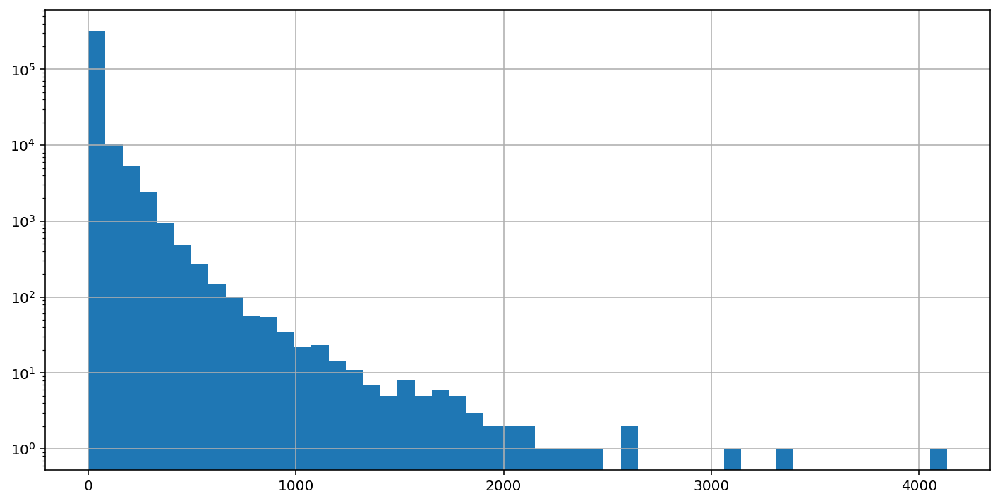

In [19]:
df[TARGET].hist(bins=50, log=True, figsize=(12,6));

## Target Over Time

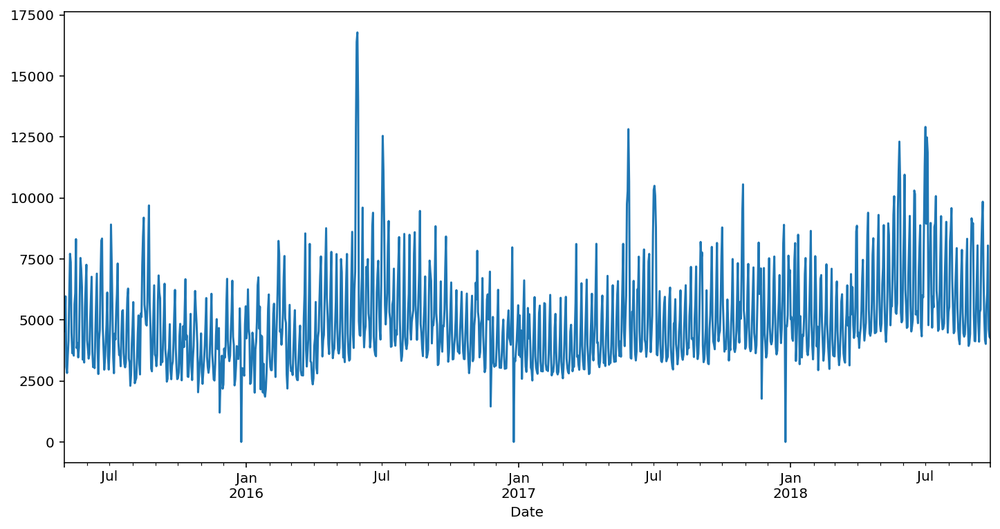

In [20]:
df.groupby([DATE_COL])[TARGET].sum().plot(figsize=(12,6));

## Plot Min, Mean, and Max
Log scale

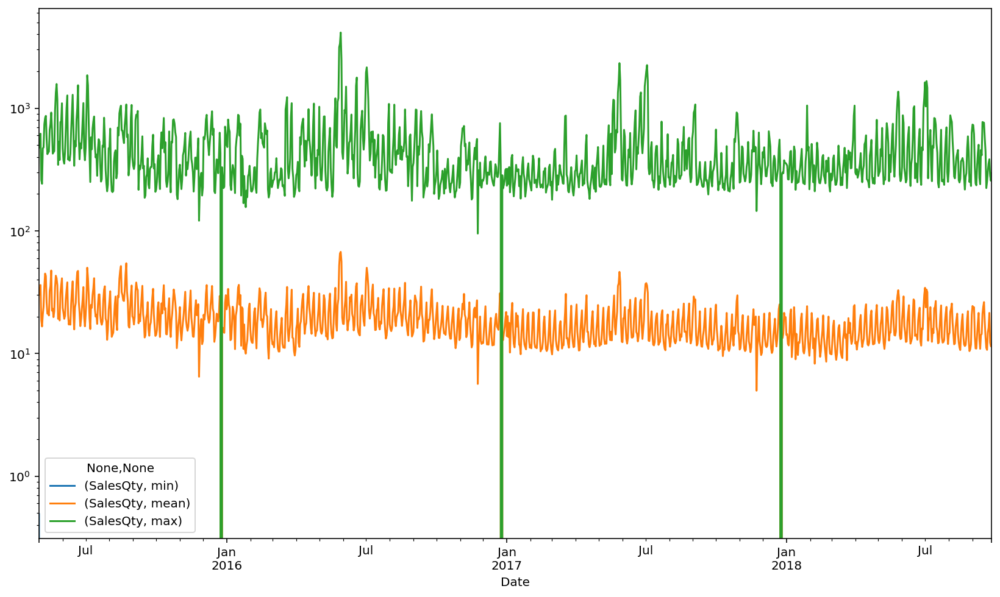

In [21]:
df.groupby([DATE_COL]).agg({TARGET: ['min', np.mean, 'max']}).plot(logy=True, figsize=(14,8));

## Fill Missing Timestamps
If dataset contains many missing values, fill in the missing time steps in the data to make the data continuous. If you have many missing dates in your data, this will allow you to run in Time based mode, instead of Row based mode. <br>
<br>
You can also use the TimeSeries Data Prep tool to fill in missing gaps in your dataset. You can use this tool in AI Catalog to fill in missing time steps, and aggregate the dataset. 

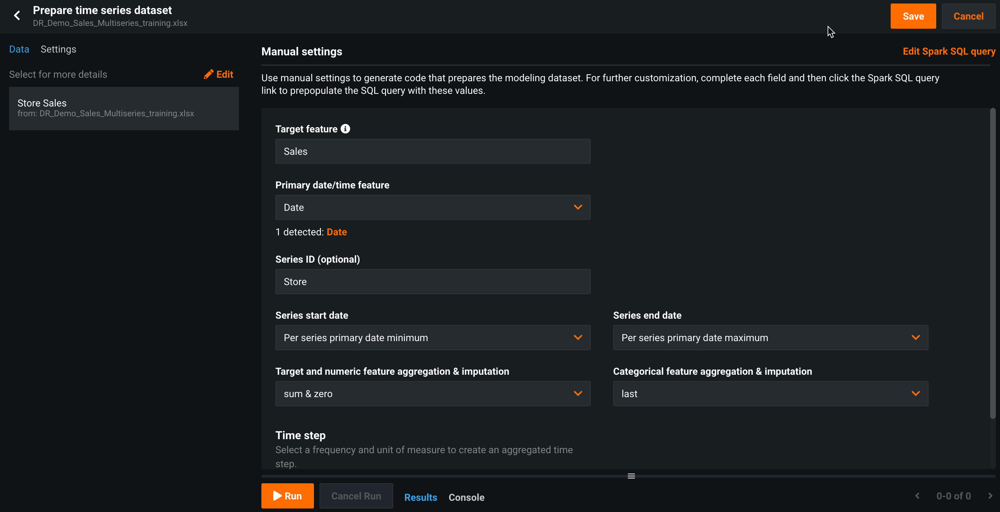

In [22]:
from IPython import display
display.Image("./Data_Prep.png")

In [23]:
# Fill missing dates so that ALL series start and end on the SAME timestamps
# This should only be used in specific situations to avoid "0" padding your dataset
def fill_missing_dataset_timestamps(group, min_timestamp, max_timestamp, freq):
    group = group.reindex(pd.date_range(min_timestamp, max_timestamp, freq=freq))
    return group

# Fill missing dates within each series, but each series could start and end on DIFFERENT timestamps
# Most likely you will want to use this function to fill in the missing dates in your data. 
def fill_missing_series_timestamps(group, freq):
    group = group.reindex(pd.date_range(group.index.min(), group.index.max(), freq=freq))
    return group

## Fill Dates so Each Series can have Different Start and End Dates

In [24]:
# Fill Missing Series - Series have different Start and End Dates
df = df.set_index(DATE_COL).groupby(SERIES_ID).apply(fill_missing_series_timestamps, freq=FREQ)
df = df.rename_axis((SERIES_ID, DATE_COL)).drop(SERIES_ID, 1).reset_index()
df.head(5)

,Series,Date,SalesQty,AvgPrice,numTransactions,Weight,Advertised,FrontPg,OnDisplay,WeekNbr,Cat,Store,Item,Month
0,01053_Alcohol_3633522291,2015-05-01,13.00000,1.89000,13.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May
1,01053_Alcohol_3633522291,2015-05-02,6.00000,1.89000,6.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May
2,01053_Alcohol_3633522291,2015-05-03,8.00000,1.89000,7.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May
3,01053_Alcohol_3633522291,2015-05-04,3.00000,1.89000,3.00000,0.00000,0.00000,0.00000,0.00000,19.00000,Alcohol,1053.00000,3633522291.00000,May
4,01053_Alcohol_3633522291,2015-05-05,6.00000,1.89000,6.00000,0.00000,0.00000,0.00000,0.00000,19.00000,Alcohol,1053.00000,3633522291.00000,May


## Fill Dates so ALL Series Start and End on Same Dates

In [25]:
# Fill Dates - All Series will have SAME Start and End Dates
# df = df.set_index(DATE_COL).groupby(SERIES_ID).apply(fill_missing_dataset_timestamps, 
#                                                      min_timestamp=df[DATE_COL].min(), 
#                                                      max_timestamp=df[DATE_COL].max(), 
#                                                      freq=FREQ)

# df = df.rename_axis((SERIES_ID, DATE_COL)).drop(SERIES_ID, 1).reset_index()
# df

## Remove Leading & Trailing 0's
This is used to removed leading and trailing 0's, known as 0 padding. <br> 
If your dataset is 0 padded (or filled with 0's) it will affect your accuracy in a negative way. <br> 
It will predict 0's accurately when the series are not actually available giving you a misleading accuracy score. 

In [26]:
def remove_leading_zeros(df, threshold=5, drop=False):
    df[DATE_COL] = pd.to_datetime(df[DATE_COL])
    df_non_zero = df[df[TARGET] != 0]
    date = df_non_zero[DATE_COL].min()
    df_begin = df[df[DATE_COL] < date]
    if df_begin.shape[0] >= threshold or pd.isnull(date):
        if drop == True:
            if pd.isnull(date):
                return pd.DataFrame(columns=df.columns)
            return df[df[DATE_COL] >= date]
        else:
            df[TARGET] = df.apply(lambda row: np.nan if pd.isnull(date) or row[DATE_COL] < date else row[TARGET], axis=1)
            return df
    else:
        return df
    

def remove_trailing_zeros(df, threshold=5, drop=False):
    df[DATE_COL] = pd.to_datetime(df[DATE_COL])
    df_non_zero = df[df[TARGET] != 0]
    date = df_non_zero[DATE_COL].max()
    df_end = df[df[DATE_COL] > date]
    if df_end.shape[0] >= threshold or pd.isnull(date):
        if drop == True:
            if pd.isnull(date):
                return pd.DataFrame(columns=df.columns)
            return df[df[DATE_COL] <= date]
        else:
            df[TARGET] = df.apply(lambda row: np.nan if pd.isnull(date) or row[DATE_COL] > date else row[TARGET], axis=1)
            return df
    else:
        return df

In [27]:
# Remove Leading Zeros
df = df.groupby(SERIES_ID).apply(remove_leading_zeros, drop=True).reset_index(drop=True)

# Remove Trailing Zeros
df = df.groupby(SERIES_ID).apply(remove_trailing_zeros)
FINISH_LEN = len(df)

df.head(5)

,Series,Date,SalesQty,AvgPrice,numTransactions,Weight,Advertised,FrontPg,OnDisplay,WeekNbr,Cat,Store,Item,Month
0,01053_Alcohol_3633522291,2015-05-01,13.00000,1.89000,13.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May
1,01053_Alcohol_3633522291,2015-05-02,6.00000,1.89000,6.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May
2,01053_Alcohol_3633522291,2015-05-03,8.00000,1.89000,7.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May
3,01053_Alcohol_3633522291,2015-05-04,3.00000,1.89000,3.00000,0.00000,0.00000,0.00000,0.00000,19.00000,Alcohol,1053.00000,3633522291.00000,May
4,01053_Alcohol_3633522291,2015-05-05,6.00000,1.89000,6.00000,0.00000,0.00000,0.00000,0.00000,19.00000,Alcohol,1053.00000,3633522291.00000,May


In [28]:
print("Length of Original dataset: ", STARTING_LEN)
print("Lengof of Cleaned dataset:  ", FINISH_LEN)
print("Difference is: ", FINISH_LEN-STARTING_LEN)

Length of Original dataset:  340673
Lengof of Cleaned dataset:   341616
Difference is:  943


# Section 2 - Find Spikes
Identify Anomalous spikes in your dataset. These spikes should be verified that they are correct, and if so, they should be added to a calendar file, or some form of Feature Engineering should be completed so that the models can be able to predict these spikes. 

In [29]:
# Identify Spikes in Dataset
df['EWA_5'] = df.groupby(SERIES_ID)[TARGET].transform(lambda x: x.ewm(span=5).mean()).fillna(value=1) # .shift(5)
df['SD_5']  = df.groupby(SERIES_ID)[TARGET].transform(lambda x: x.ewm(span=5).std()).fillna(value=1)  # .shift(5)
df['Threshold'] = (4 * df['SD_5'])
# df['Thresh_Min'] = 500
# df['Spike'] = np.where(df[TARGET] >= df[['Threshold','Thresh_Min']].max(axis=1), 1, 0)
df['Spike'] = np.where(df[TARGET] >= df['Threshold'], 1, 0)

In [30]:
df.loc[df['Spike'] == 1 ][[SERIES_ID, TARGET, 'EWA_5', 'SD_5', 'Threshold', 'Spike']]\
.sort_values(by=[TARGET], ascending=False).head(10)

,Series,SalesQty,EWA_5,SD_5,Threshold,Spike
177848,01063_Milk_Carton_3633502989,943.00000,734.38167,219.12585,876.50339,1
177638,01063_Milk_Carton_3633502989,921.00000,717.55146,209.57798,838.31192,1
177736,01063_Milk_Carton_3633502989,872.00000,735.08329,174.00853,696.03412,1
171510,01063_Meats_2522465979,818.00000,628.53567,202.57287,810.29149,1
177847,01063_Milk_Carton_3633502989,787.00000,630.07250,176.69945,706.79779,1
61892,01053_Meats_2522465979,765.00000,693.76699,187.64094,750.56376,1
177917,01063_Milk_Carton_3633502989,753.00000,608.35281,170.27295,681.09181,1
177637,01063_Milk_Carton_3633502989,741.00000,615.67209,164.38286,657.53143,1
260371,01064_Milk_Carton_3633502989,739.00000,550.41163,171.96636,687.86544,1
177735,01063_Milk_Carton_3633502989,721.00000,647.06540,153.69245,614.76978,1


## Plot Selected Series

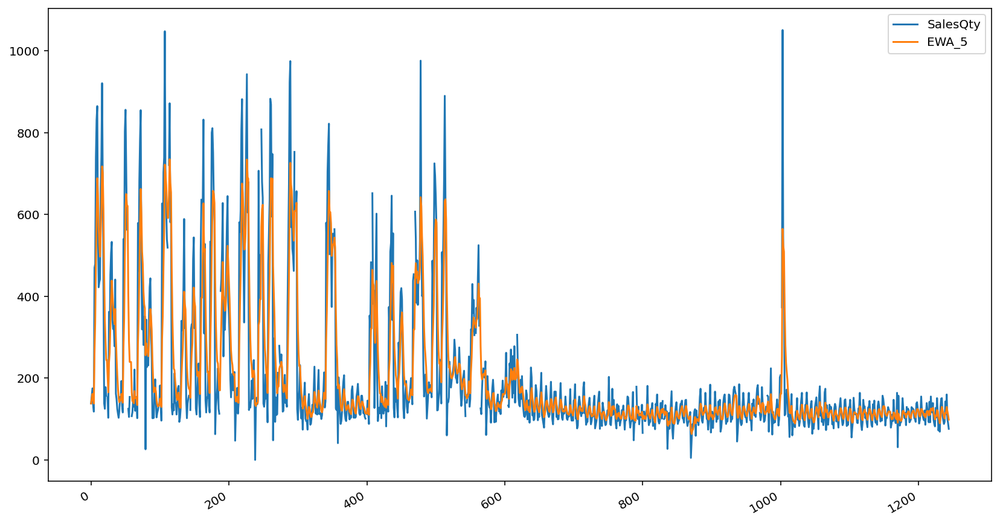

In [31]:
df.loc[df[SERIES_ID] == '01063_Milk_Carton_3633502989'][[DATE_COL, TARGET, 'EWA_5']]\
.plot(kind='line', x=DATE_COL, y=[TARGET, 'EWA_5'], use_index=False, figsize=(14,8));

## Filter Dataset down
Remove very short series and low velocity goods if desired.

In [32]:
summary = df.groupby([SERIES_ID], as_index=False).agg({DATE_COL: ['min', 'max', 'count'],
                                                  TARGET: ['min', np.mean, 'max'],
                                                  }).reset_index(level=0, drop=True)

summary.columns = ['id', 'date_min', 'date_max', 'records', 'qty_min', 'qty_mean', 'qty_max']

summary['series_Weeks'] = summary.date_max - summary.date_min 
summary['series_Weeks'] = summary['series_Weeks'] / np.timedelta64(1, 'W')


## Begin Filtering Criteria
summary = summary.loc[summary['records']  >= 6]  # More than 6 records
summary = summary.loc[summary['qty_mean'] >= 5]  # Qty Mean Greater than 5

summary.sort_values(by=['records'], ascending=False)

,id,date_min,date_max,records,qty_min,qty_mean,qty_max,series_Weeks
0,01053_Alcohol_3633522291,2015-05-01,2018-09-26,1245,0.00000,6.34486,59.00000,177.71429
154,01063_Alcohol_3633522294,2015-05-01,2018-09-26,1245,0.00000,27.41646,80.00000,177.71429
183,01063_Deli_3633542407,2015-05-01,2018-09-26,1245,0.00000,27.71290,138.00000,177.71429
182,01063_Deli_3633542405,2015-05-01,2018-09-26,1245,0.00000,7.51249,33.00000,177.71429
169,01063_Cereal_3633558066,2015-05-01,2018-09-26,1245,0.00000,19.33333,177.00000,177.71429
...,...,...,...,...,...,...,...,...
78,01062_Alcohol_3633522293,2017-09-14,2018-09-26,378,0.00000,48.05053,162.00000,53.85714
77,01062_Alcohol_3633522292,2017-09-14,2018-09-26,378,0.00000,164.09651,650.00000,53.85714
135,01062_Milk_Carton_3633502989,2017-09-14,2018-09-26,378,0.00000,93.58445,502.00000,53.85714
115,01062_Fresh_Fruits_2522464674,2017-09-15,2018-09-26,377,0.00000,8.67593,49.31000,53.71429


## Series Length Histogram

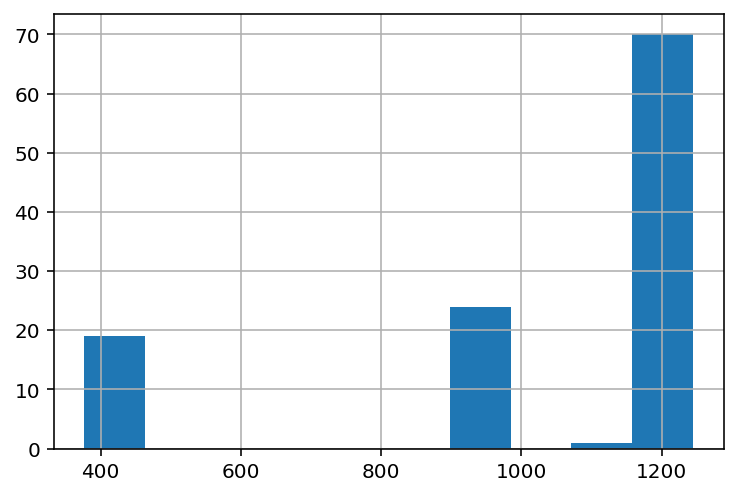

In [33]:
summary['records'].hist();

## Filter DataFrame
If you are filtering out short and/or low velocity series uncomment the code in the cell below and run.

In [34]:
# df = df.loc[df['id'].isin(summary[SERIES_ID])]
# df.head(5)

## Average Qty per Series

In [35]:
summary = df.groupby([SERIES_ID], as_index=False).agg({DATE_COL: ['min', 'max', 'count'],
                                                  TARGET: ['min', np.mean, 'max'],
                                                  }).reset_index(level=0, drop=True)

summary.columns = ['id', 'date_min', 'date_max', 'records', 'qty_min', 'qty_mean', 'qty_max']

summary['series_Weeks'] = summary.date_max - summary.date_min 
summary['series_Weeks'] = summary['series_Weeks'] / np.timedelta64(1, 'W')

summary.sort_values(by=['series_Weeks'], ascending=False)

,id,date_min,date_max,records,qty_min,qty_mean,qty_max,series_Weeks
0,01053_Alcohol_3633522291,2015-05-01,2018-09-26,1245,0.00000,6.34486,59.00000,177.71429
207,01063_Milk_Carton_3633501990,2015-05-01,2018-09-26,1245,0.00000,115.60359,549.00000,177.71429
194,01063_Fresh_Vegetables_2522465461,2015-05-01,2018-09-26,1245,0.00000,63.21239,171.00000,177.71429
195,01063_Fresh_Vegetables_2522465462,2015-05-01,2018-09-26,1245,0.00000,4.06610,27.85000,177.71429
197,01063_Juice_3633461941,2015-05-01,2018-09-26,1245,0.00000,8.16600,32.00000,177.71429
...,...,...,...,...,...,...,...,...
224,01063_Soft_Drinks_3722462192,2018-04-15,2018-09-26,165,0.00000,1.19394,9.00000,23.42857
299,01064_Soft_Drinks_3722462192,2018-04-15,2018-09-26,165,0.00000,1.12727,9.00000,23.42857
74,01053_Soft_Drinks_3722462192,2018-04-16,2018-09-26,164,0.00000,0.35220,5.00000,23.28571
308,01115_Almond_Milk_3633464207,2018-04-21,2018-09-26,159,0.00000,2.15723,7.00000,22.57143


# Section 3 - Clustering the data
If your dataset is large and you have a large number of Series it can be beneficial to break the dataset up into smaller datasets that put similar items together. 

## Get Monthly sales 

In [36]:
# Last 12 Months
# agg = df.loc[df[DATE_COL] >= df[DATE_COL].max() - timedelta(days=365)].pivot_table(values=TARGET, index=SERIES_ID, columns='Month', aggfunc='sum').fillna(value=0)
# agg.reset_index(inplace=True)

# All Data
agg = df.pivot_table(values=TARGET, index=SERIES_ID, columns='Month', aggfunc='sum').fillna(value=0)
agg.reset_index(inplace=True)

agg.columns = [SERIES_ID, 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
agg.head(2)

,Series,January,February,March,April,May,June,July,August,September,October,November,December
0,01053_Alcohol_3633522291,535.00000,720.00000,695.00000,566.00000,703.00000,723.00000,657.00000,680.00000,676.00000,659.00000,654.00000,625.00000
1,01053_Alcohol_3633522292,9566.00000,16085.00000,13965.00000,10190.00000,11931.00000,15653.00000,13231.00000,16944.00000,16558.00000,14493.00000,13628.00000,15499.00000


In [37]:
X = agg[['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']].copy()
X = MinMaxScaler(feature_range=(0, 5)).fit_transform(X)

## Set Cluster Info
Set the desired cluster size in the cell below. This is roughly how many Series you want per cluster. Depending on the density of each cluster this number can fluctuate. 

In [38]:
UNIQUE_SERIES = df[SERIES_ID].nunique()   
EPS_TRUNCATE = int(UNIQUE_SERIES * 0.05)
CLUSTER_SIZE = 100  # Set the desired number of Series per Cluster
NUM_CLUSTERS = int(UNIQUE_SERIES / CLUSTER_SIZE)

print("Number of Unique Series: {}".format(UNIQUE_SERIES))
print("Number of Cluster: {}".format(NUM_CLUSTERS))

Number of Unique Series: 376
Number of Cluster: 3


## Dimensionality Reduction and Clustering
Note the Random States have been set

In [39]:
pca = umap.UMAP(n_neighbors=10, 
                n_components=3, 
                metric='euclidean',   
                output_metric='euclidean',  
                learning_rate=1.0, 
                init='spectral', 
                min_dist=0.5, 
                spread=1.0,  
                set_op_mix_ratio=1.0,
                local_connectivity=1.0, 
                repulsion_strength=1.0, 
                negative_sample_rate=5, 
                transform_queue_size=4.0,  
                angular_rp_forest=False, 
                target_n_neighbors=-1, 
                target_metric='categorical', 
                target_weight=0.5,
                random_state=RANDOM_STATE
                )

principalComponents = pca.fit_transform(X)
embedding = pd.DataFrame(data = principalComponents, columns = ['PC_1', 'PC_2', 'PC_3'])

clusterer = KMeans(n_clusters=NUM_CLUSTERS, random_state=RANDOM_STATE) 
clusterer.fit(embedding)

labels = pd.DataFrame(clusterer.labels_, columns=['Cluster'])
principalDf = agg.join([labels, embedding])
principalDf = principalDf[[SERIES_ID, 'Cluster', 'January', 'February', 
                           'March', 'April', 'May', 'June', 'July', 'August', 
                           'September', 'October', 'November', 'December', 
                           'PC_1', 'PC_2', 'PC_3']]

# 2D
# fig = px.scatter(principalDf, x='PC_1', y='PC_2', color='Cluster', width=600, height=600)

# 3D
fig = px.scatter_3d(principalDf, x='PC_1', y='PC_2', z='PC_3', color='Cluster', 
                    hover_data=['Cluster'], width=800, height=800)
fig.show()

In [40]:
print(len(df[SERIES_ID].unique()))
print(len(principalDf[SERIES_ID].unique()))

376
376


## Cluster Counts
Number of Series per Cluster

In [41]:
pd.DataFrame(principalDf.groupby(['Cluster'])['Cluster'].count())

,Cluster
Cluster,
0,163
1,201
2,12


## Plot Clusters - Series level
Plot a sample of Series for each Cluster to visualize Clustering results. Note random_state has been set for reproducibility. 

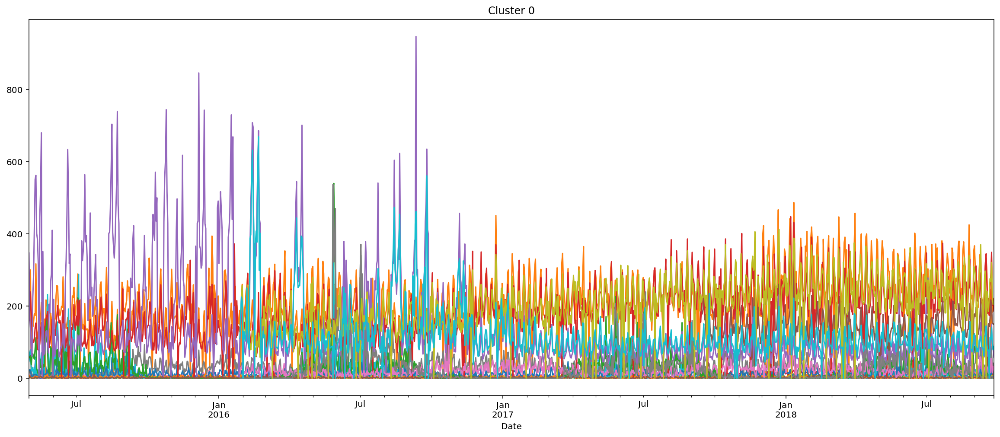

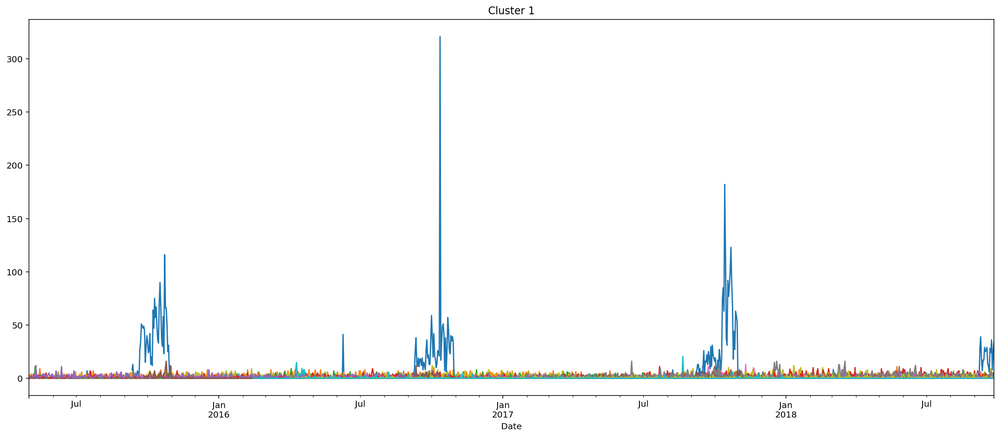

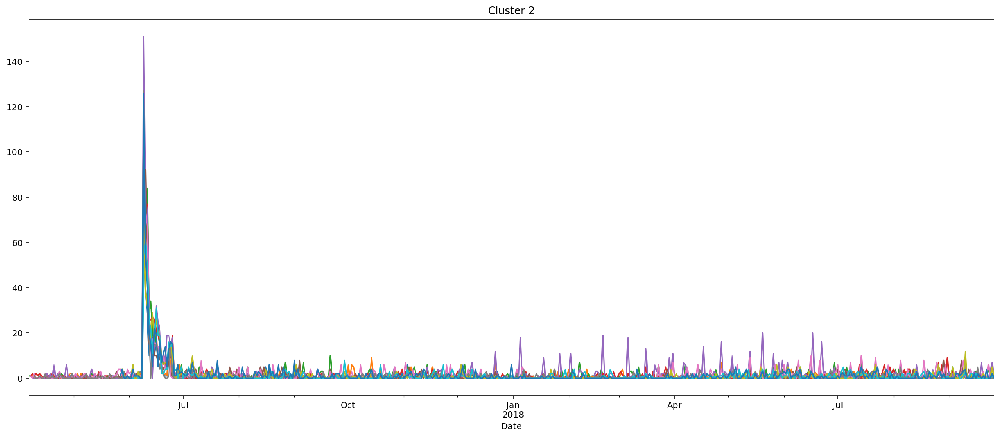

In [42]:
clusters_1 = principalDf.Cluster.unique().tolist()
clusters_1.sort()
clusters_1

for c in clusters_1:
    series_items = principalDf.loc[principalDf['Cluster'] == int(c)][SERIES_ID].sample(20, 
                                                                                       random_state=RANDOM_STATE,
                                                                                       replace=True).tolist()
    pdf = df[df[SERIES_ID].isin(series_items)]
    pdf = pdf[[TARGET, DATE_COL, SERIES_ID]] 

    pdf.sort_values(by=[DATE_COL, SERIES_ID], ascending=True, inplace=True)
    pd.pivot_table(pdf, 
                   aggfunc='sum',
                   values=TARGET, 
                   index=[DATE_COL],
                   columns=[SERIES_ID]).plot(figsize=(20, 8), legend=False, title="Cluster {0}". format(c))

# Section 4 - Modeling Factory

## Months
Get the number of Months of dataset. This can be used later if truncating the data is needed. 

In [43]:
MONTHS = '' 

def months(df):
    global MONTHS
    MIN_DATE = df[DATE_COL].min()
    MAX_DATE = df[DATE_COL].max()
    MONTHS = str(int((MAX_DATE - MIN_DATE).days / 30))
     
    print('Min Date: ', MIN_DATE)
    print('Max Date: ', MAX_DATE)
    print('Months:   ', MONTHS)

In [44]:
months(df)

Min Date:  2015-05-01 00:00:00
Max Date:  2018-09-26 00:00:00
Months:    41


## Join Cluster info to Dataframe
Add the Cluster each Series belongs to to the dataframe. 

In [45]:
print(len(df[SERIES_ID].unique()))
print(len(principalDf[SERIES_ID].unique()))

376
376


In [47]:
data = df.merge(principalDf[[SERIES_ID, 'Cluster']], on=SERIES_ID, how='left')
# data.drop(labels=['Month', 'Cluster_x'], axis=1, inplace=True)
# data.rename(columns={'Cluster_y':'Cluster'}, inplace=True)
data.drop(columns=['EWA_5', 'SD_5', 'Threshold', 'Spike'], axis=1, inplace=True)

data.head(5)

,Series,Date,SalesQty,AvgPrice,numTransactions,Weight,Advertised,FrontPg,OnDisplay,WeekNbr,Cat,Store,Item,Month,Cluster
0,01053_Alcohol_3633522291,2015-05-01,13.00000,1.89000,13.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May,0
1,01053_Alcohol_3633522291,2015-05-02,6.00000,1.89000,6.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May,0
2,01053_Alcohol_3633522291,2015-05-03,8.00000,1.89000,7.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May,0
3,01053_Alcohol_3633522291,2015-05-04,3.00000,1.89000,3.00000,0.00000,0.00000,0.00000,0.00000,19.00000,Alcohol,1053.00000,3633522291.00000,May,0
4,01053_Alcohol_3633522291,2015-05-05,6.00000,1.89000,6.00000,0.00000,0.00000,0.00000,0.00000,19.00000,Alcohol,1053.00000,3633522291.00000,May,0


In [48]:
data['Cluster'].unique()

array([0, 1, 2], dtype=int32)

In [49]:
# Check to make sure all Series are assigned a Cluster
data.loc[data['Cluster'].isnull()]

,Series,Date,SalesQty,AvgPrice,numTransactions,Weight,Advertised,FrontPg,OnDisplay,WeekNbr,Cat,Store,Item,Month,Cluster


## Plot Cluster - Sums

### All In One - Check Scale

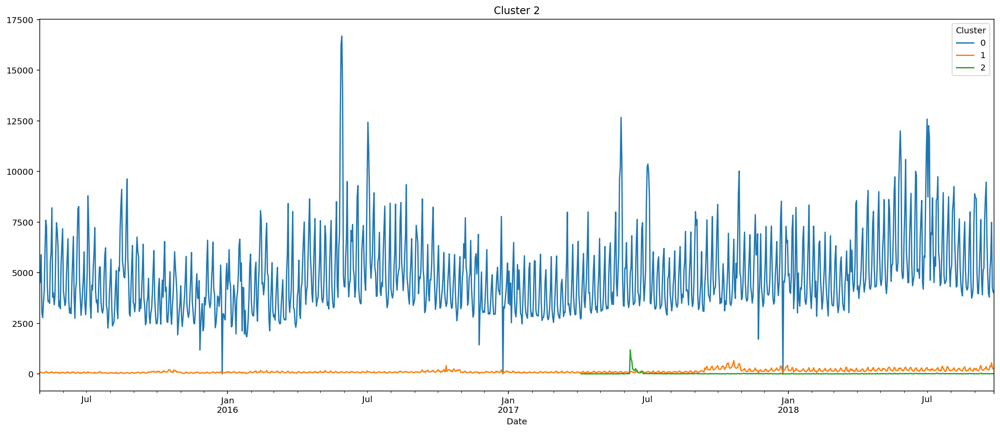

In [50]:
pdf = data[[TARGET, DATE_COL, SERIES_ID, 'Cluster']] 

pdf.sort_values(by=[DATE_COL, SERIES_ID], ascending=True, inplace=True)
pd.pivot_table(pdf, 
               values=TARGET, 
               index=[DATE_COL],
               columns=['Cluster'],
               aggfunc='sum').plot(figsize=(20, 8), legend=True, title="Cluster {0}". format(c));

### Subplots
Note, random_state has been set

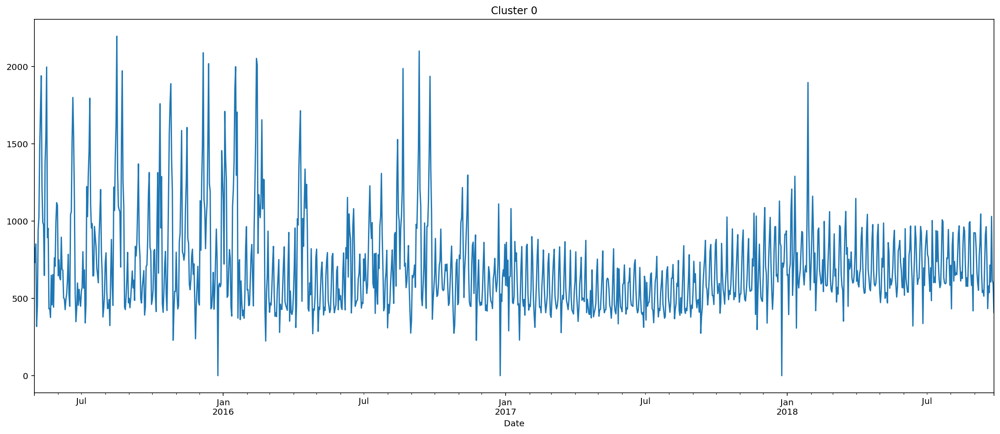

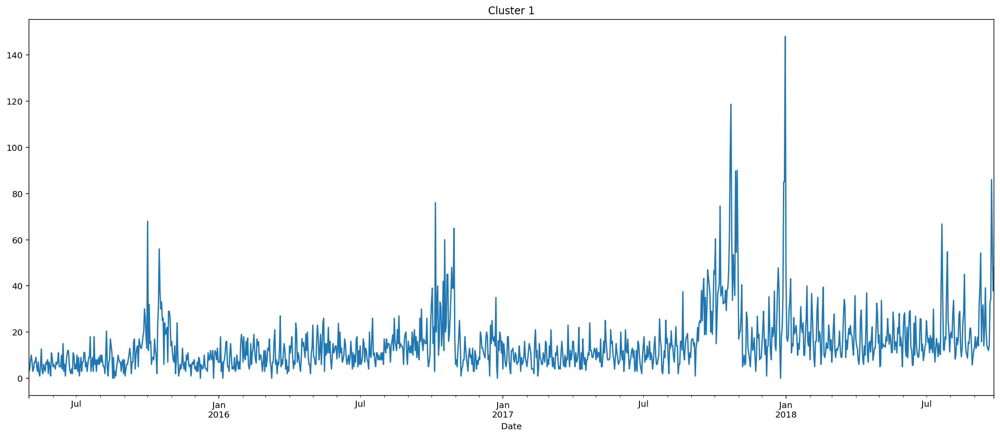

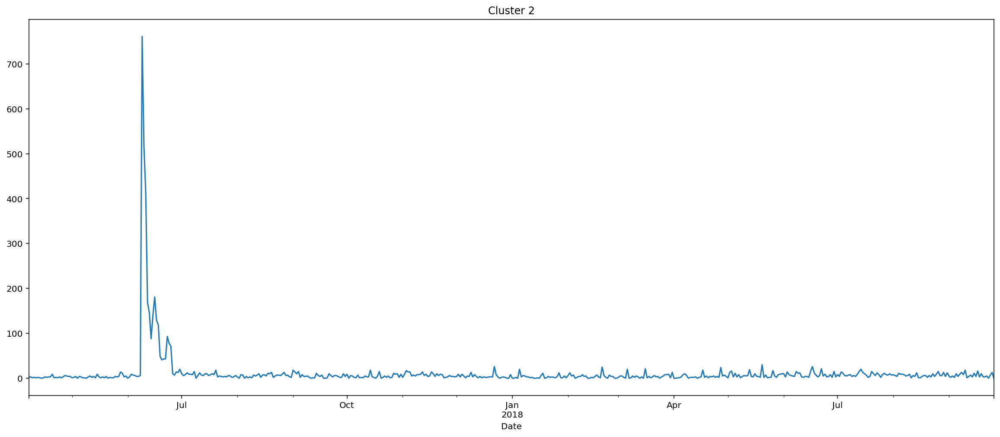

In [51]:
clusters_1 = data.Cluster.unique().tolist()
clusters_1.sort()
clusters_1

for c in clusters_1:
    series_items = data[data['Cluster'] == int(c)][SERIES_ID].sample(20, 
                                                                     random_state=RANDOM_STATE,
                                                                     replace=True).tolist()
    pdf = data[data[SERIES_ID].isin(series_items)]
    pdf = pdf[[TARGET, DATE_COL, SERIES_ID]] 

    pdf.sort_values(by=[DATE_COL, SERIES_ID], ascending=True, inplace=True)
    pd.pivot_table(pdf, 
                   aggfunc='sum',
                   values=TARGET, 
                   index=[DATE_COL]).plot(figsize=(20, 8), legend=False, title="Cluster {0}". format(c))

## Metrics per Cluster

In [52]:
clus_summary = data.groupby(['Cluster'], as_index=False)\
.agg({DATE_COL: ['min', 'max', 'count'],
      TARGET: ['min', np.mean, 'max'],
    }).reset_index(level=0, drop=True)

clus_summary.columns = ['Cluster', 'date_min', 'date_max', 'records', 'qty_min', 'qty_mean', 'qty_max']

clus_summary['series_Weeks'] = clus_summary.date_max - clus_summary.date_min 
clus_summary['series_Weeks'] = clus_summary['series_Weeks'] / np.timedelta64(1, 'W')

clus_summary.sort_values(by=['records'], ascending=False)

,Cluster,date_min,date_max,records,qty_min,qty_mean,qty_max,series_Weeks
0,0,2015-05-01,2018-09-26,177973,0.00000,34.19623,4136.00000,177.71429
1,1,2015-05-01,2018-09-26,157379,0.00000,1.00660,321.00000,177.71429
2,2,2017-04-06,2018-09-26,6264,0.00000,1.46836,151.00000,76.85714


## Create TS Settings

In [53]:
SPLIT_COL = 'Cluster'

PROJECT_NAME = 'ACME'

VERSION = '1'
MODE    = 'Q'

# CLUSTERS = [0,1]
CLUSTERS = data.Cluster.unique().tolist()
CLUSTERS.sort()


FDWS = [(-35,0)]  
FDS  = [(1,7)]  

BASE   = PROJECT_NAME + '_V:'

PREFIX = BASE + VERSION + '_Mnths:' + MONTHS + '_Mode:' + MODE
DATASET_FILENAME = 'Months_' + MONTHS
MAX_WAIT = 14400
READ_TIMEOUT = 14400


# Defaults
HOLDOUT_START_DATE  = None # pd.to_datetime('2021-03-29')
VALIDATION_DURATION = None # dr.helpers.partitioning_methods.construct_duration_string(years=0, months=0, days=28) 
HOLDOUT_DURATION    = None # dr.helpers.partitioning_methods.construct_duration_string(years=0, months=0, days=28)   
NUMBER_BACKTESTS    = None # 1 
GAP_DURATION        = dr.helpers.partitioning_methods.construct_duration_string(years=0, months=0, days=7) 


# Known In Advance columns
# Creates lags, AND uses the current value at prediction time
KIA_VARS = ['Advertised', 'FrontPg', 'OnDisplay', 'WeekNbr']

# Do Not Dervive columns
# Only creates 1 lag
# DND_VARS = []

# KIA & Do Not Derive Columns
# Only uses the actual value at prediction time, NO lags at all
KIA_DND = ['Cat', 'Store', 'Month']

    
FEATURE_SETTINGS = []

for column in KIA_VARS:
    FEATURE_SETTINGS.append(dr.FeatureSettings(column, known_in_advance=True, do_not_derive=False))

# for column in DND_VARS:
#     FEATURE_SETTINGS.append(dr.FeatureSettings(column, known_in_advance=False, do_not_derive=True))
    
for column in KIA_DND:
    FEATURE_SETTINGS.append(dr.FeatureSettings(column, known_in_advance=True, do_not_derive=True))

    
# Add Calendar file
CAL = dr.CalendarFile.create('data/Acme_Calendar.csv',
                              calendar_name = 'US_Calendar')

CAL_ID = CAL.id

print(FEATURE_SETTINGS)
print(' ')
print(CAL_ID)


[FeatureSettings(feature_name='Advertised', known_in_advance=True, do_not_derive=False), FeatureSettings(feature_name='FrontPg', known_in_advance=True, do_not_derive=False), FeatureSettings(feature_name='OnDisplay', known_in_advance=True, do_not_derive=False), FeatureSettings(feature_name='WeekNbr', known_in_advance=True, do_not_derive=False), FeatureSettings(feature_name='Cat', known_in_advance=True, do_not_derive=True), FeatureSettings(feature_name='Store', known_in_advance=True, do_not_derive=True), FeatureSettings(feature_name='Month', known_in_advance=True, do_not_derive=True)]
 
60c0bf7fea27f86b93ac91a9


In [54]:
# Take sample record to get KIA and DND variables for above
data.head(1)

,Series,Date,SalesQty,AvgPrice,numTransactions,Weight,Advertised,FrontPg,OnDisplay,WeekNbr,Cat,Store,Item,Month,Cluster
0,01053_Alcohol_3633522291,2015-05-01,13.00000,1.89000,13.00000,0.00000,0.00000,0.00000,0.00000,18.00000,Alcohol,1053.00000,3633522291.00000,May,0


## Create functions for Model Factory

### Function below creates the DataRobot TimeSeries project. 

In [58]:
def create_dr_project(df, project_name, fw_start=None, fw_end=None, fdw_start=None, fdw_end=None, 
                      dataset_filename=DATASET_FILENAME, cal_id=CAL_ID):
    ###############################
    # Create Datetime Specification
    ###############################
    PREFIX = BASE + str(VERSION) + '_Mnths:' + MONTHS + '_Mode:' + MODE
    DATASET_FILENAME = 'Months_' + str(MONTHS)
    
    time_partition = dr.DatetimePartitioningSpecification(
        datetime_partition_column = DATE_COL,
        forecast_window_start     = fw_start, 
        forecast_window_end       = fw_end,
        feature_derivation_window_start = fdw_start,
        feature_derivation_window_end   = fdw_end,
        disable_holdout           = False,
        holdout_start_date        = HOLDOUT_START_DATE ,
        validation_duration       = VALIDATION_DURATION,  
        holdout_duration          = HOLDOUT_DURATION,
        number_of_backtests       = NUMBER_BACKTESTS, 
        feature_settings          = FEATURE_SETTINGS,
        use_time_series           = True,
        multiseries_id_columns    = [SERIES_ID],
        calendar_id               = CAL_ID,
        windows_basis_unit        = None, # Row Based = 'ROW' ; Time Based = None
        model_splits              = 5,
        allow_partial_history_time_series_predictions = False
      )
     

    ################
    # Create Project
    ################
    project = dr.Project.create(
        project_name = project_name, 
        sourcedata   = df, 
        max_wait     = MAX_WAIT, 
        read_timeout = READ_TIMEOUT,
        dataset_filename = DATASET_FILENAME
    )
    
    print("Post-Project MB: ", (df.memory_usage(index=True).sum()/1024/1024).round(2))
    print("Post-Project Records: {:,}".format(len(df)))
    print("Post-Project Series: {:,}".format(df[SERIES_ID].nunique()))
    print(f'Project {project_name} Created...')
    print(" ")

    
    
    ##########################
    # Set any Advanced Options
    ##########################    
    advanced_opts = dr.helpers.AdvancedOptions(
        weights = None, 
        response_cap = None, 
        blueprint_threshold = None, 
        seed = RANDOM_STATE,      # Random seed Set
        smart_downsampled = False, 
        majority_downsampling_rate = None, 
        offset = None, 
        exposure = None, 
        accuracy_optimized_mb = None, 
        scaleout_modeling_mode = None, 
        events_count = None, 
        monotonic_increasing_featurelist_id = None, 
        monotonic_decreasing_featurelist_id = None, 
        only_include_monotonic_blueprints = None, 
        allowed_pairwise_interaction_groups = None, 
        blend_best_models = None, 
        scoring_code_only = None, 
        prepare_model_for_deployment = None, 
        consider_blenders_in_recommendation = None, 
        min_secondary_validation_model_count = None, 
        shap_only_mode = None, 
        autopilot_data_sampling_method = None, 
        run_leakage_removed_feature_list = None, 
        autopilot_with_feature_discovery = False, 
        feature_discovery_supervised_feature_reduction = True
        )  
    
    
    
    #################
    # Start Autopilot
    #################
    project.set_target(
        target = TARGET,   
        metric = None,      
        mode   = dr.AUTOPILOT_MODE.QUICK, # dr.AUTOPILOT_MODE.FULL_AUTO,  QUICK
        advanced_options = advanced_opts,
        worker_count = -1,
        partitioning_method = time_partition,
        max_wait = MAX_WAIT
    )
    
    return project


## Model Factory 
Where we iterate through various Time Series settings; Clusters, Feature Derivation Windows, and Forecast Distances

In [59]:
projects = []  # Keep List of all projects

def model_factory(df, FDWS, FDS):
    PREFIX = BASE + str(VERSION) + '_Mnths:' + str(MONTHS) + '_Mode:' + MODE
    DATASET_FILENAME = 'Months_' + str(MONTHS)
    result = len(CLUSTERS) * len(FDWS) * len(FDS)
    proj_num = 1
    print(f"Kicking off {result} projects!")
    print(" ")
    
    for c in CLUSTERS:
        for fdw in FDWS:
            for fd in FDS:
                fd_start  = fd[0] 
                fd_end    = fd[1]
                fdw_start = fdw[0]
                fdw_end   = fdw[1]

                print(f"Project {proj_num}")
  
                # Name project
                project_name = f"{PREFIX}_FDW:{fdw_start}-{fdw_end}_FD:{fd_start}-{fd_end}_Clus:{c}"  
                print(project_name)
                print(" ")

                df = data.loc[data['Cluster'] == c]
                df = df.drop(SPLIT_COL, axis=1)

                # Create project
                project = create_dr_project(df, project_name, 
                                            fw_start=fd_start, fw_end=fd_end, 
                                            fdw_start=fdw_start, fdw_end=fdw_end,
                                            dataset_filename=DATASET_FILENAME,
                                            cal_id=CAL_ID)

                projects.append(project) 
                proj_num = proj_num + 1

## Model

In [60]:
model_factory(df, FDWS, FDS)

Kicking off 3 projects!
 
Project 1
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
 
Post-Project MB:  20.37
Post-Project Records: 177,973
Post-Project Series: 163
Project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0 Created...
 
Project 2
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:1
 
Post-Project MB:  18.01
Post-Project Records: 157,379
Post-Project Series: 201
Project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:1 Created...
 
Project 3
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
 
Post-Project MB:  0.72
Post-Project Records: 6,264
Post-Project Series: 12
Project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2 Created...
 


### Version 2: Try shorter FDW

In [61]:
VERSION = '2'

FDWS = [(-28,0)]   

In [62]:
model_factory(df, FDWS, FDS)

Kicking off 3 projects!
 
Project 1
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0
 
Post-Project MB:  20.37
Post-Project Records: 177,973
Post-Project Series: 163
Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0 Created...
 
Project 2
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1
 
Post-Project MB:  18.01
Post-Project Records: 157,379
Post-Project Series: 201
Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1 Created...
 
Project 3
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2
 
Post-Project MB:  0.72
Post-Project Records: 6,264
Post-Project Series: 12
Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2 Created...
 


### Version 3: Truncate data to X Months

In [63]:
VERSION = 3

In [64]:
# Set Feature Derivation Window to -35 to 0
FDWS = [(-35,0)]

In [65]:
NUM_MONTHS = 39

MAX_DATE = df[DATE_COL].max()
TRUNCATE_DATE = MAX_DATE - timedelta(weeks=(NUM_MONTHS*4))
MONTHS = str(int((MAX_DATE - TRUNCATE_DATE).days / 30))

print('Max Date:      ', MAX_DATE)
print('Months:        ', MONTHS)
print('Truncate Date: ', TRUNCATE_DATE)

Max Date:       2018-09-26 00:00:00
Months:         36
Truncate Date:  2015-09-30 00:00:00


In [66]:
df_36 = df.loc[df['Date'] >= TRUNCATE_DATE]

In [67]:
months(df_36)

Min Date:  2015-09-30 00:00:00
Max Date:  2018-09-26 00:00:00
Months:    36


In [68]:
model_factory(df_36, FDWS, FDS)

Kicking off 3 projects!
 
Project 1
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
 
Post-Project MB:  20.37
Post-Project Records: 177,973
Post-Project Series: 163
Project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0 Created...
 
Project 2
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:1
 
Post-Project MB:  18.01
Post-Project Records: 157,379
Post-Project Series: 201
Project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:1 Created...
 
Project 3
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
 
Post-Project MB:  0.72
Post-Project Records: 6,264
Post-Project Series: 12
Project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2 Created...
 


## Get Project Names in a List

In [69]:
projects = dr.Project.list(search_params={'project_name': BASE}) 
projects

[Project(ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2),
 Project(ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:1),
 Project(ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0),
 Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2),
 Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1),
 Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0),
 Project(ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2),
 Project(ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:1),
 Project(ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0)]

## Get Project Names and PIDs in a List

In [216]:
lst = []

for p in projects:
    r = ((p, p.id))
    lst.append(r)
lst

## Unlock Holdouts

In [71]:
for i in lst:
    project = Project.get(i[1])
    project.unlock_holdout()

## Compute Backtests for Blenders

In [72]:
for i in lst:
    project = Project.get(i[1])
    lb = project.get_datetime_models()
    for model in lb:
        
        if 'Blender' in model.model_type:
            try:
                print(project.project_name, model)  # , model.id
                dr.DatetimeModel.score_backtests(model) 
                print(f'Computing backtests for model {model.id} in Project {project.project_name}')
            except dr.errors.ClientError:
                pass
            print(f'All available backtests have been submitted for scoring for project {project.project_name}')
            print(' ')
        else:
            None # print(f'No Blenders Found in  {project.project_name}')

ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2 DatetimeModel('AVG Blender')
All available backtests have been submitted for scoring for project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
 
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2 DatetimeModel('AVG Blender')
Computing backtests for model 60c0cc86dc4fad8e46982dbe in Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2
 
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1 DatetimeModel('AVG Blender')
Computing backtests for model 60c0d1fb111be9d7668e2e67 in Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1
All available backtests have been submitted for scoring for project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1
 
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0 DatetimeModel('AVG Blender')
Computing backtests for model 60c0d1ef5a4b6af8b0a64ca2 in Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_

## Compute All Backtests for Top Models in Backtest 1 and Holdout groups

In [73]:
OPTIMIZE_GROUP = ['validation', 'holdout']

In [74]:
PROJECT_METRIC = project.metric
METRICS = list(set([PROJECT_METRIC, 'MASE', 'RMSE']))

In [75]:
for p in lst :
    for met in METRICS:
        for o in OPTIMIZE_GROUP:
            project = Project.get(p[1])
            lb = project.get_datetime_models()

            best_models = sorted(
                                [model for model in lb if model.metrics[met][o]],  
                                key=lambda m: m.metrics[met][o],
                                )[0:5]
            
            for mod in best_models:

                if mod.metrics[met]["backtesting"] == None:
                    try:
                        print(project.project_name, mod)  
                        dr.DatetimeModel.score_backtests(mod) 
                        print(f'Computing backtests for model {mod.model_type} in Project {project.project_name}')
                    except dr.errors.ClientError:
                        pass
                    print(f'All available backtests have been submitted for scoring for project {project.project_name}')
                    print(' ')
                else:
                    print(project.project_name)
                    print(f'{mod.model_type} All Backtests Already Computed')
                    print(' ')

ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
RandomForest Regressor All Backtests Already Computed
 
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2 DatetimeModel('eXtreme Gradient Boosting on ElasticNet Predictions')
Computing backtests for model eXtreme Gradient Boosting on ElasticNet Predictions in Project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
 
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
Ridge Regressor using Linearly Decaying Weights with Forecast Distance Modeling All Backtests Already Computed
 
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2 DatetimeModel('Ridge Regressor with Forecast Distance Modeling')
Computing backtests for model Ridge Regressor with Forecast Distance Modeling in Project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0

ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support All Backtests Already Computed
 
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
Performance Clustered eXtreme Gradient Boosted Trees Regressor All Backtests Already Computed
 
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
Performance Clustered eXtreme Gradient Boosting on Elastic Net Predictions All Backtests Already Computed
 
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0 DatetimeModel('RandomForest Regressor')
Computing backtests for model RandomForest Regressor in Project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
All available backtests have been submitted for scoring for project ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
 
ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0 DatetimeModel('Performance Clustered eXtreme Gradient Boosted Trees Regressor')
All available backtests have been submitted for scoring for project ACME_V:3_Mnths:36_M

Computing backtests for model Ridge Regressor with Forecast Distance Modeling in Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2
 
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2 DatetimeModel('Ridge Regressor with Forecast Distance Modeling')
Computing backtests for model Ridge Regressor with Forecast Distance Modeling in Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2
 
ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1 DatetimeModel('Temporal Hierarchical Model with Elastic Net and XGBoost')
Computing backtests for model Temporal Hierarchical Model with Elastic Net and XGBoost in Project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1
All available backtests have been submitted for scoring for project ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0

Computing backtests for model Ridge Regressor with Forecast Distance Modeling in Project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2 DatetimeModel('Performance Clustered Elastic Net Regressor with Forecast Distance Modeling')
Computing backtests for model Performance Clustered Elastic Net Regressor with Forecast Distance Modeling in Project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2 DatetimeModel('Vector Autoregressive Model (VAR)')
Computing backtests for model Vector Autoregressive Model (VAR) in Project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2
All available backtests have been submitted for scoring for project ACME_V:1_Mnths:41_Mode:Q

Computing backtests for model RandomForest Regressor in Project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
All available backtests have been submitted for scoring for project ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
AVG Blender All Backtests Already Computed
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
Performance Clustered eXtreme Gradient Boosted Trees Regressor All Backtests Already Computed
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
Performance Clustered eXtreme Gradient Boosted Trees Regressor All Backtests Already Computed
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support All Backtests Already Computed
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
Performance Clustered eXtreme Gradient Boosting on Elastic Net Predictions All Backtests Already Computed
 
ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:0
AVG Blender All B

## Get Project and Model Scores

In [76]:
OPTIMIZATION_PERIOD = 'validation'  # BackTest 1: validation  All Backtest: backtesting  Holdout: holdout 

## Function to pull the leaderboard.
This will be used as we iterate and test

In [77]:

def leaderboard(project_list=lst):
    """
    This function pulls the blueprints from the leaderboard
    along with all accuracy metrics. 
    
    Input: 
            A list containing  
            Project Name, Project ID
    
    [(Project(<Project Name>),
     '<Project ID>'),
     (Project(<Project Name 2>),
     '<Project ID 2>')]
     
     Returns: 
             dataframe of leaderboard
             
    """
    
    df_name = pd.DataFrame()
    
    for p in project_list:
        project = Project.get(p[1])
        lb = project.get_datetime_models()
        best_models = sorted(
                            [model for model in lb if model.metrics[project.metric][OPTIMIZATION_PERIOD]],  
                            key=lambda m: m.metrics[project.metric][OPTIMIZATION_PERIOD],
                           )
        for m in best_models:

            backtest_scores = pd.DataFrame(
                [
                    {
                        'Project_Name': project.project_name,
                        'Project_ID': project.id,
                        'Model_ID': m.id,
                        'Permalink': m.get_leaderboard_ui_permalink(),
                        'Model_Type': m.model_type,
                        'Featurelist': m.featurelist_name,
                        'Optimization_Metric': project.metric,
                        'Scores': m.metrics,
                    }
                ]
            )
            df_name = df_name.append(backtest_scores, sort=False).reset_index(drop=True)  


    print(f'Scores for all {len(project_list)} projects have been computed')
    print('')

    df_name = df_name.join(json_normalize(df_name["Scores"].tolist())).drop(labels=['Scores'], axis=1) 

    # Drop Empty Columns
    df_name = df_name[df_name.columns.drop(list(df_name.filter(regex='crossValidation$')))]
    df_name = df_name[df_name.columns.drop(list(df_name.filter(regex='_All_BTScores$')))]
    df_name = df_name[df_name.columns.drop(list(df_name.filter(regex='.training$')))]

    # Rename Columns
    df_name.columns = df_name.columns.str.replace(".backtesting", "_All_BT")
    df_name.columns = df_name.columns.str.replace(".holdout", "_Holdout")
    df_name.columns = df_name.columns.str.replace(".validation", "_BT_1")
    df_name.columns = df_name.columns.str.replace(' ', '_')

    
    df_name['FDW_Start'] = df_name['Project_Name'].str.extract(r'FDW:(-\d{1,2})')
    df_name['FDW_End']   = df_name['Project_Name'].str.extract(r'FDW:-\d{1,2}-(\d{1,2})_')
    df_name['Cluster']   = df_name['Project_Name'].str.extract(r'(\d{1,2}$)')
    df_name['FD_Start']  = df_name['Project_Name'].str.extract(r'FD:(\d{1,2})')
    df_name['FD_End']    = df_name['Project_Name'].str.extract(r'FD:\d{1,2}-(\d{1,2})')
    df_name['Months']    = df_name['Project_Name'].str.extract(r'_Mnths:(\d{1,2})_')

    return df_name


In [217]:
scores = leaderboard(project_list=lst)
scores.head(5)

In [79]:
METRICS = scores.filter(regex='MASE|RMSE').columns.to_list()
# PROJECT = ['Project_Name', 'Project_ID', 'Model_ID', 'Model_Type', 'Featurelist']
PROJECT = ['Project_Name', 'Permalink', 'Optimization_Metric']
COLS = PROJECT + METRICS

In [218]:
scores[COLS]

## Get Best Model

In [219]:
hrmse = scores.loc[scores['RMSE_All_BT'].notnull()]

# Take the Single Best model
# hrmse_best = pd.DataFrame(hrmse.loc[hrmse.RMSE_All_BT.idxmin()]).transpose()

# Take the Best model by Project Name
hrmse_best = hrmse.loc[hrmse.groupby('Cluster').RMSE_All_BT.idxmin()]

best_models = pd.DataFrame(hrmse_best) 
best_models

# Section 5 - Model Evaluation Insights

# Feature Impact

In [88]:
RECORD = 0

In [89]:
PID = best_models['Project_ID'].values[RECORD]
MID = best_models['Model_ID'].values[RECORD]

project = dr.Project.get(PID)
print(project)
print(" ")

model   = dr.Model.get(PID, MID)
print(model)
print(" ")

feature_impacts = model.get_or_request_feature_impact()

Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0)
 
Model('AVG Blender')
 


In [90]:
dr_dark_blue = '#08233F'
dr_blue      = '#1F77B4'
dr_orange    = '#FF7F0E'
dr_red       = '#BE3C28'

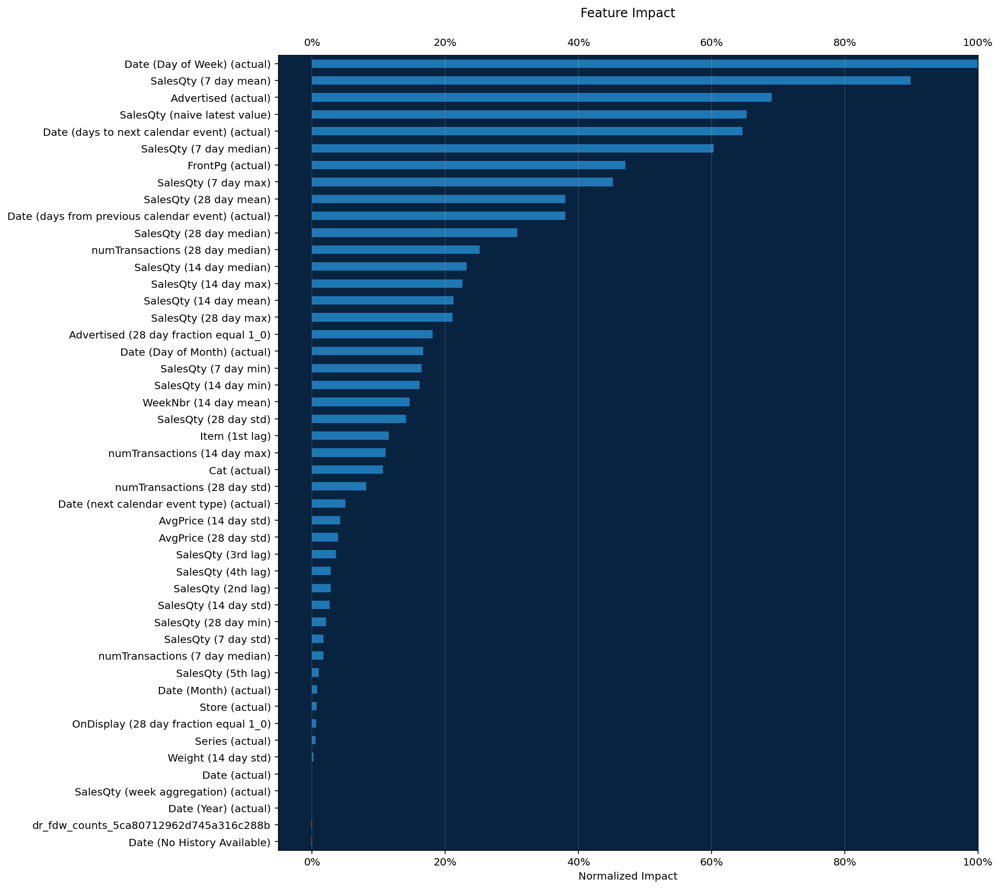

In [91]:
percent_tick_fmt = mtick.PercentFormatter(xmax=1.0)

impact_df = pd.DataFrame(feature_impacts)
impact_df.sort_values(by='impactNormalized', ascending=True, inplace=True)

# Positive values are blue, negative are red
bar_colors = impact_df.impactNormalized.apply(lambda x: dr_red if x < 0
                                              else dr_blue)

ax = impact_df.plot.barh(x='featureName', y='impactNormalized',
                         legend=False,
                         color=bar_colors,
                         figsize=(12, 14))
ax.xaxis.set_major_formatter(percent_tick_fmt)
ax.xaxis.set_tick_params(labeltop=True)
ax.xaxis.grid(True, alpha=0.2)
ax.set_facecolor(dr_dark_blue)

plt.ylabel('')
plt.xlabel('Normalized Impact')
plt.xlim((None, 1))  # Allow for negative impact
plt.title('Feature Impact', y=1.04);

## Histogram

In [92]:
def matplotlib_pair_histogram(labels, counts, target_avgs,
                              bin_count, ax1, feature):
    
#     ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
#     ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    
    # Rotate categorical labels
    if feature.feature_type in ['Categorical', 'Text', 'Numeric']:
        ax1.tick_params(axis='x', rotation=45)
        
    ax1.set_ylabel(feature.name, color=dr_blue)
    ax1.bar(labels, counts, color=dr_blue)
    ax1.set_xticklabels([str(round(float(label), 2)) for label in labels])
    
    # Instantiate a second axes that shares the same x-axis
    ax2 = ax1.twinx()
    ax2.set_ylabel(TARGET, color=dr_orange)
    ax2.plot(labels, target_avgs, marker='o', lw=1, color=dr_orange)
    ax1.set_facecolor(dr_dark_blue)
    title = 'Histogram for {} ({} bins)'.format(feature.name, bin_count)
    ax1.set_title(title)
    
def draw_feature_histogram(feature_name, bin_count):
    feature = dr.Feature.get(project.id, feature_name)
    # Retrieve downsampled histogram data
    # Based on desired bin count
    data = feature.get_histogram(bin_count).plot
    
    data = pd.DataFrame(data, columns=['label', 'count', 'target'])
    data['label'] = data['label'].astype(float).astype(int).astype(str)
    data = data.to_dict(orient='records')
    
    labels = [row['label'] for row in data]
    counts = [row['count'] for row in data]
    target_averages = [row['target'] for row in data]
    f, axarr = plt.subplots()
    f.set_size_inches((10, 4))
    matplotlib_pair_histogram(labels, counts, target_averages,
                              bin_count, axarr, feature)

### List Features

In [93]:
project.get_features()

[Feature(Date (Day of Month)),
 Feature(AvgPrice),
 Feature(Date (Day of Week)),
 Feature(Cat),
 Feature(Date (Year)),
 Feature(SalesQty),
 Feature(FrontPg),
 Feature(Month),
 Feature(Date (Month)),
 Feature(Store),
 Feature(Date),
 Feature(OnDisplay),
 Feature(numTransactions),
 Feature(Weight),
 Feature(Advertised),
 Feature(Item),
 Feature(WeekNbr),
 Feature(Series)]

### Feature Histogram

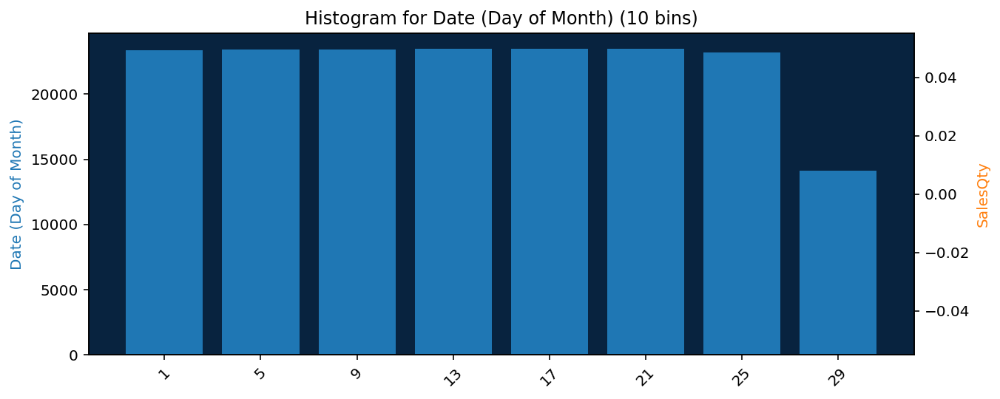

In [95]:
draw_feature_histogram('Date (Day of Month)', 10)

# Feature Lists

## Reduced Feature Lists
<font color=lightblue>
Three Methods to Choose from:</font> <br>
&nbsp;&nbsp; &nbsp; &nbsp; 1. Percent of Top Features <br> 
&nbsp;&nbsp; &nbsp; &nbsp; 2. Number of Top Features <br>
&nbsp;&nbsp; &nbsp; &nbsp; 3. Manually Specifying Features <br>

### Create DataFrame to store Feature List Names and IDs

In [96]:
feature_lists_df = pd.DataFrame()

### Top X Percent of Features

In [97]:
THRESHOLD = 0.95

In [220]:
print(f'Collecting Feature Impact for M{model.model_number} in project "{project.project_name}"')

impact = pd.DataFrame.from_records(model.get_or_request_feature_impact())
impact['cumulative_impact'] = impact['impactUnnormalized'].cumsum() / impact['impactUnnormalized'].sum()

to_keep = np.where(impact['cumulative_impact'] <= THRESHOLD)[0]
if len(to_keep) < 1:
    print('Applying this threshold would result in a featurelist with no features')


idx = np.max(to_keep)

selected_features = impact.loc[0:idx, 'featureName'].to_list()
feature_list = project.create_modeling_featurelist(f'Top {len(selected_features)} features M{model.model_number}', 
                                                   selected_features)


cust_feat_list = pd.DataFrame(
    [
        {
            'Name': feature_list.name,
            'ID': feature_list.id
        }
    ]
)
feature_lists_df = feature_lists_df.append(cust_feat_list, sort=False).reset_index(drop=True) 

feature_lists_df

### Raise Threshold and create another feature list

In [99]:
THRESHOLD = 0.99

In [221]:
print(f'Collecting Feature Impact for M{model.model_number} in project "{project.project_name}"')

impact = pd.DataFrame.from_records(model.get_or_request_feature_impact())
impact['cumulative_impact'] = impact['impactUnnormalized'].cumsum() / impact['impactUnnormalized'].sum()

to_keep = np.where(impact['cumulative_impact'] <= THRESHOLD)[0]
if len(to_keep) < 1:
    print('Applying this threshold would result in a featurelist with no features')


idx = np.max(to_keep)

selected_features = impact.loc[0:idx, 'featureName'].to_list()
feature_list = project.create_modeling_featurelist(f'Top {len(selected_features)} features M{model.model_number}', 
                                                   selected_features)


cust_feat_list = pd.DataFrame(
    [
        {
            'Name': feature_list.name,
            'ID': feature_list.id
        }
    ]
)
feature_lists_df = feature_lists_df.append(cust_feat_list, sort=False).reset_index(drop=True) 

feature_lists_df

### Top X Features

In [101]:
MAX_FEATURES = 12

In [222]:
print(f'Collecting Feature Impact for M{model.model_number} in project "{project.project_name}"')

impact = model.get_or_request_feature_impact()

impact.sort(key=lambda x: x['impactNormalized'], reverse=True)
feature_list_items = [f['featureName'] for f in impact[:MAX_FEATURES]]

feature_list = project.create_modeling_featurelist(f'Top {MAX_FEATURES} features M{model.model_number}', 
                                                   feature_list_items)


cust_feat_list = pd.DataFrame(
    [
        {
            'Name': feature_list.name,
            'ID': feature_list.id
        }
    ]
)

feature_lists_df = feature_lists_df.append(cust_feat_list, sort=False).reset_index(drop=True) 

feature_lists_df

### Manually Select Features

In [103]:
project.get_modeling_features()

[ModelingFeature(dr_forecast_point),
 ModelingFeature(Advertised (28 day fraction equal 1_0)),
 ModelingFeature(SalesQty (28 day mean)),
 ModelingFeature(numTransactions (28 day median)),
 ModelingFeature(SalesQty (7 day mean)),
 ModelingFeature(OnDisplay (28 day fraction equal 1_0)),
 ModelingFeature(SalesQty (nonzero) (7 day min) (log) (diff 28 day mean)),
 ModelingFeature(SalesQty (is zero) (14 day fraction equal 1) (diff 28 day mean)),
 ModelingFeature(SalesQty (14 day max) (diff 28 day mean)),
 ModelingFeature(SalesQty (week aggregation) (actual)),
 ModelingFeature(AvgPrice (14 day std)),
 ModelingFeature(SalesQty (28 day min) (diff 28 day mean)),
 ModelingFeature(SalesQty (14 day min) (diff 28 day mean)),
 ModelingFeature(SalesQty (nonzero) (14 day min) (log) (diff 28 day mean)),
 ModelingFeature(SalesQty (14 day mean) (diff 28 day mean)),
 ModelingFeature(SalesQty (is zero) (3rd lag) (diff 28 day mean)),
 ModelingFeature(SalesQty (is zero) (7 day fraction equal 1) (diff 28 day m

### List Feature By Normalized Impact

In [104]:
feature_impacts = model.get_or_request_feature_impact()

feature_impacts.sort(key=lambda x: x['impactNormalized'], reverse=True)
feature_impacts

[{'redundantWith': None,
  'featureName': 'Date (Day of Week) (actual)',
  'impactNormalized': 1.0,
  'impactUnnormalized': 9.117706173258881},
 {'redundantWith': None,
  'featureName': 'SalesQty (7 day mean)',
  'impactNormalized': 0.898966223924997,
  'impactUnnormalized': 8.196509889432171},
 {'redundantWith': None,
  'featureName': 'Advertised (actual)',
  'impactNormalized': 0.6900550959658883,
  'impactUnnormalized': 6.29171960837693},
 {'redundantWith': None,
  'featureName': 'SalesQty (naive latest value)',
  'impactNormalized': 0.6523573224221783,
  'impactUnnormalized': 5.948002385819329},
 {'redundantWith': None,
  'featureName': 'Date (days to next calendar event) (actual)',
  'impactNormalized': 0.6464576846665809,
  'impactUnnormalized': 5.894211222235128},
 {'redundantWith': None,
  'featureName': 'SalesQty (7 day median)',
  'impactNormalized': 0.6030926139692062,
  'impactUnnormalized': 5.498821249433867},
 {'redundantWith': None,
  'featureName': 'FrontPg (actual)',
 

### Manually Select Features and put them into a List
Copy and paste from list above

In [105]:
FEATURES = ['Date (Day of Week) (actual)', 'Date (days from previous calendar event) (actual)',
            'SalesQty (7 day mean)', 'SalesQty (naive latest value)', 
            'SalesQty (14 day mean)', 'Advertised (actual)']

print(len(FEATURES))

6


In [223]:
feature_list = project.create_modeling_featurelist(f'Manual Feature Selection {len(FEATURES)}', FEATURES)


cust_feat_list = pd.DataFrame(
    [
        {
            'Name': feature_list.name,
            'ID': feature_list.id
        }
    ]
)

feature_lists_df = feature_lists_df.append(cust_feat_list, sort=False).reset_index(drop=True) 

feature_lists_df

### Create Another Manually selected Feature List

In [107]:
FEATURES = ['Date (Day of Week) (actual)', 'Date (days from previous calendar event) (actual)', 
            'SalesQty (7 day mean)', 'SalesQty (naive latest value)', 
            'SalesQty (14 day mean)', 'Advertised (actual)', 'numTransactions (28 day median)',
            'FrontPg (actual)', 'SalesQty (14 day std)']

print(len(FEATURES))

9


In [224]:
feature_list = project.create_modeling_featurelist(f'Manual Feature Selection {len(FEATURES)}', FEATURES)

cust_feat_list = pd.DataFrame(
    [
        {
            'Name': feature_list.name,
            'ID': feature_list.id
        }
    ]
)

feature_lists_df = feature_lists_df.append(cust_feat_list, sort=False).reset_index(drop=True) 

feature_lists_df

### List All Feature Lists

In [109]:
project.get_modeling_featurelists()

[ModelingFeaturelist(Timeseries Extracted Features),
 ModelingFeaturelist(Timeseries Informative Features),
 ModelingFeaturelist(Baseline Only (latest)),
 ModelingFeaturelist(Date Only),
 ModelingFeaturelist(No Differencing),
 ModelingFeaturelist(Target Derived Only Without Differencing),
 ModelingFeaturelist(With Differencing (average baseline)),
 ModelingFeaturelist(With Differencing (nonzero average baseline)),
 ModelingFeaturelist(Univariate Selections),
 ModelingFeaturelist(DR Reduced Features M15),
 ModelingFeaturelist(Top 24 features M50),
 ModelingFeaturelist(Top 32 features M50),
 ModelingFeaturelist(Top 12 features M50),
 ModelingFeaturelist(Manual Feature Selection 6),
 ModelingFeaturelist(Manual Feature Selection 9)]

### Run Blueprints on New Feature Lists

In [225]:
feature_lists_df

### Get Models/Blueprints to run new Feature Lists on

### Select the Top 5 Blueprints and put Model IDs in a list

In [226]:
MODELS = scores.loc[scores['Project_ID'] == PID]\
.sort_values(by=['RMSE_All_BT']).head(5)['Model_ID']

MODELS

In [ ]:
# Manually Select Model IDs
# If you want to manually select the Models to run against the new Feature Lists
# Fill in the Models ID's below
# MODELS = ['', '', '']

### Run New Feature Lists against selected Blueprints

In [112]:
DURATION = dr.helpers.partitioning_methods.construct_duration_string(years=2, months=8, days=18)

In [113]:
for m in MODELS :
    project = Project.get(PID)
    model   = dr.Model.get(project, m)
    
    for fl in feature_lists_df.values:
        fl_id = fl[1] 
        try:
                ## Add Duration to train_datetime
            model.train_datetime(featurelist_id = fl_id, 
                                 training_duration=DURATION)
            print(f"Running Feature List {fl[0]} on Model {model.model_type}")
        except dr.errors.ClientError:
            pass
        print(f"Feature List {fl[0]} already run on Model {model.model_type}")
        print(' ')

Feature List Top 24 features M50 already run on Model AVG Blender
 
Feature List Top 32 features M50 already run on Model AVG Blender
 
Feature List Top 12 features M50 already run on Model AVG Blender
 
Feature List Manual Feature Selection 6 already run on Model AVG Blender
 
Feature List Manual Feature Selection 9 already run on Model AVG Blender
 
Running Feature List Top 24 features M50 on Model eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support
Feature List Top 24 features M50 already run on Model eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support
 
Running Feature List Top 32 features M50 on Model eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support
Feature List Top 32 features M50 already run on Model eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support
 
Running Feature List Top 12 features M50 on Model eXtreme Gradient Boosting Regressor with Early Stopping and New Seri

### Create List for Selected Project

In [227]:
selected_project = filter(lambda p: p[1] == PID, lst)
selected_project = list(selected_project)

selected_project

In [228]:
scores_features = leaderboard(project_list=selected_project)

# Include Only Feature Lists Manually created from Above
# scores_features = scores_features.loc[scores_features['Featurelist'].isin(feature_lists_df['Name'])]

scores_features.head(5)

In [229]:
scores_features[COLS]

### Get best model

In [230]:
hrmse = scores_features.loc[scores_features['RMSE_All_BT'].notnull()]
hrmse = hrmse.loc[hrmse['Model_Type'] != 'AVG Blender']

# Take the Single Best model
# hrmse_best = pd.DataFrame(hrmse.loc[hrmse.RMSE_All_BT.idxmin()]).transpose()

# Take the Best model by Project Name
hrmse_best = hrmse.loc[hrmse.groupby('Cluster').RMSE_All_BT.idxmin()]

best_models_features = pd.DataFrame(hrmse_best) 
best_models_features

# Generate Predictions on the modeling workers
This is for testing, BEFORE deploying the Blueprint to the prediction server. <br>
This method is for testing only, NOT for production

### If Prediction Explanations are to be included 
We need to run the cells below to get Feature Impact and then initialize Prediction Explanations

In [118]:
RECORD = 0

# Verify correct project
PID = best_models_features['Project_ID'].values[RECORD]
MID = best_models_features['Model_ID'].values[RECORD]

project = dr.Project.get(PID)
model   = dr.Model.get(PID, MID)
print(project, model)

Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0) Model('eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support')


In [119]:
# Upload prediction dataset 
# This will be used for establishing prediction explanation
dataset = project.upload_dataset('data/Acme_Test_Cluster_0.csv')

In [120]:
# Run Feature Impact
# Need to do this to get Prediction Explanations
model.get_or_request_feature_impact()

[{'redundantWith': None,
  'featureName': 'SalesQty (7 day mean)',
  'impactNormalized': 1.0,
  'impactUnnormalized': 9.777269552483922},
 {'redundantWith': None,
  'featureName': 'Date (Day of Week) (actual)',
  'impactNormalized': 0.864104692383787,
  'impactUnnormalized': 8.448584499002486},
 {'redundantWith': None,
  'featureName': 'Date (days to next calendar event) (actual)',
  'impactNormalized': 0.7495521614390622,
  'impactUnnormalized': 7.3285735260366565},
 {'redundantWith': None,
  'featureName': 'Advertised (actual)',
  'impactNormalized': 0.7129020394196637,
  'impactUnnormalized': 6.970235403921571},
 {'redundantWith': None,
  'featureName': 'SalesQty (7 day max)',
  'impactNormalized': 0.6627665625853177,
  'impactUnnormalized': 6.480047332769857},
 {'redundantWith': None,
  'featureName': 'SalesQty (naive latest value)',
  'impactNormalized': 0.5932606275590953,
  'impactUnnormalized': 5.800469070521046},
 {'redundantWith': None,
  'featureName': 'SalesQty (7 day media

In [121]:
# Compute predictions
predict_job = model.request_predictions(dataset.id)

In [122]:
# Initialize Prediction Explanations
pei_job = dr.PredictionExplanationsInitialization.create(PID, MID)

In [124]:
# Compute Prediction Explanations
pe_job = dr.PredictionExplanations.create(project.id, model.id, dataset.id)
pe = pe_job.get_result_when_complete()

In [125]:
# Get Prediction Explanations as a Dataframe
pred_exp = pe.get_all_as_dataframe()
pred_exp

,row_id,prediction,explanation_0_feature,explanation_0_feature_value,explanation_0_label,explanation_0_qualitative_strength,explanation_0_strength,explanation_1_feature,explanation_1_feature_value,explanation_1_label,explanation_1_qualitative_strength,explanation_1_strength,explanation_2_feature,explanation_2_feature_value,explanation_2_label,explanation_2_qualitative_strength,explanation_2_strength
0,51,3.69103,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-17.49522,SalesQty (7 day median),0.00000,SalesQty (actual),---,-15.28814,SalesQty (naive latest value),3.00000,SalesQty (actual),--,-6.23734
1,52,3.83318,SalesQty (7 day median),0.00000,SalesQty (actual),---,-24.76728,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-18.77639,SalesQty (naive latest value),3.00000,SalesQty (actual),--,-7.17425
2,53,3.45923,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-16.67129,SalesQty (7 day median),0.00000,SalesQty (actual),--,-5.25844,SalesQty (14 day median),1.00000,SalesQty (actual),--,-4.65901
3,54,2.57798,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-17.32528,SalesQty (7 day median),0.00000,SalesQty (actual),--,-4.84710,SalesQty (14 day median),1.00000,SalesQty (actual),--,-4.55620
4,55,2.57798,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-17.32528,SalesQty (7 day median),0.00000,SalesQty (actual),--,-4.84710,SalesQty (14 day median),1.00000,SalesQty (actual),--,-4.55620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
832,7730,10.20752,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.22766,SalesQty (7 day max),25.00000,SalesQty (actual),--,-4.19796,SalesQty (7 day median),8.00000,SalesQty (actual),--,-4.08395
833,7731,9.44667,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.75699,SalesQty (7 day median),8.00000,SalesQty (actual),--,-3.66404,SalesQty (7 day max),25.00000,SalesQty (actual),--,-2.99822
834,7732,9.44667,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.75699,SalesQty (7 day median),8.00000,SalesQty (actual),--,-3.66404,SalesQty (14 day min),3.00000,SalesQty (actual),--,-3.56161
835,7733,7.89606,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.23909,SalesQty (7 day max),25.00000,SalesQty (actual),--,-3.11896,SalesQty (14 day median),6.50000,SalesQty (actual),--,-2.58671


# Section 6 - Get Forecasts using the Modeling workers
This is for testing and validation BEFORE deploying the model

### Community Article on setting up a prediction file 
https://community.datarobot.com/t5/resources/data-setup-for-time-series-predictions/ta-p/7388

In [126]:
RECORD = 0

# Verify correct project
PID = best_models_features['Project_ID'].values[RECORD]
MID = best_models_features['Model_ID'].values[RECORD]

project = dr.Project.get(PID)
model   = dr.Model.get(PID, MID)
print(project, model)

Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0) Model('eXtreme Gradient Boosting Regressor with Early Stopping and New Series Support')


### Upload the Test dataset, and get predictions with 85% Prediction Intervals and 3 Prediction Explanations
Note the wall time when getting predictions using the Modeling workers. <br>
This is just for testing BEFORE deploying to production

In [127]:
%%time

dataset = project.upload_dataset('data/Acme_Test_Cluster_0.csv')

pred_job = model.request_predictions(dataset_id = dataset.id,
                                     include_prediction_intervals = True,
                                     prediction_intervals_size = 85
                                    )

preds = pred_job.get_result_when_complete()

preds.head(5)

CPU times: user 452 ms, sys: 67.5 ms, total: 519 ms
Wall time: 6min


,series_id,forecast_distance,forecast_point,prediction,prediction_interval_lower_bound,prediction_interval_upper_bound,row_id,timestamp
0,01053_Alcohol_3633522291,1,2018-11-16T00:00:00.000000Z,3.69103,0.47841,6.14793,51,2018-11-17T00:00:00.000000Z
1,01053_Alcohol_3633522291,2,2018-11-16T00:00:00.000000Z,3.83318,0.59759,6.31103,52,2018-11-18T00:00:00.000000Z
2,01053_Alcohol_3633522291,3,2018-11-16T00:00:00.000000Z,3.45923,0.21665,5.92187,53,2018-11-19T00:00:00.000000Z
3,01053_Alcohol_3633522291,4,2018-11-16T00:00:00.000000Z,2.57798,-0.55875,5.00040,54,2018-11-20T00:00:00.000000Z
4,01053_Alcohol_3633522291,5,2018-11-16T00:00:00.000000Z,2.57798,-0.60271,4.96715,55,2018-11-21T00:00:00.000000Z


### Join Predictions and Intervals to Explanations

In [128]:
fin_df = preds.merge(pred_exp, how='left', on='row_id')
fin_df.drop(labels=['prediction_y'], axis=1, inplace=True)
fin_df.rename(columns={'prediction_x':'prediction'}, inplace=True)
fin_df

,series_id,forecast_distance,forecast_point,prediction,prediction_interval_lower_bound,prediction_interval_upper_bound,row_id,timestamp,explanation_0_feature,explanation_0_feature_value,explanation_0_label,explanation_0_qualitative_strength,explanation_0_strength,explanation_1_feature,explanation_1_feature_value,explanation_1_label,explanation_1_qualitative_strength,explanation_1_strength,explanation_2_feature,explanation_2_feature_value,explanation_2_label,explanation_2_qualitative_strength,explanation_2_strength
0,01053_Alcohol_3633522291,1,2018-11-16T00:00:00.000000Z,3.69103,0.47841,6.14793,51,2018-11-17T00:00:00.000000Z,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-17.49522,SalesQty (7 day median),0.00000,SalesQty (actual),---,-15.28814,SalesQty (naive latest value),3.00000,SalesQty (actual),--,-6.23734
1,01053_Alcohol_3633522291,2,2018-11-16T00:00:00.000000Z,3.83318,0.59759,6.31103,52,2018-11-18T00:00:00.000000Z,SalesQty (7 day median),0.00000,SalesQty (actual),---,-24.76728,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-18.77639,SalesQty (naive latest value),3.00000,SalesQty (actual),--,-7.17425
2,01053_Alcohol_3633522291,3,2018-11-16T00:00:00.000000Z,3.45923,0.21665,5.92187,53,2018-11-19T00:00:00.000000Z,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-16.67129,SalesQty (7 day median),0.00000,SalesQty (actual),--,-5.25844,SalesQty (14 day median),1.00000,SalesQty (actual),--,-4.65901
3,01053_Alcohol_3633522291,4,2018-11-16T00:00:00.000000Z,2.57798,-0.55875,5.00040,54,2018-11-20T00:00:00.000000Z,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-17.32528,SalesQty (7 day median),0.00000,SalesQty (actual),--,-4.84710,SalesQty (14 day median),1.00000,SalesQty (actual),--,-4.55620
4,01053_Alcohol_3633522291,5,2018-11-16T00:00:00.000000Z,2.57798,-0.60271,4.96715,55,2018-11-21T00:00:00.000000Z,SalesQty (7 day mean),1.28571,SalesQty (actual),---,-17.32528,SalesQty (7 day median),0.00000,SalesQty (actual),--,-4.84710,SalesQty (14 day median),1.00000,SalesQty (actual),--,-4.55620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
832,01115_Pizzas_3633541599,3,2018-11-16T00:00:00.000000Z,10.20752,3.66792,18.94339,7730,2018-11-19T00:00:00.000000Z,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.22766,SalesQty (7 day max),25.00000,SalesQty (actual),--,-4.19796,SalesQty (7 day median),8.00000,SalesQty (actual),--,-4.08395
833,01115_Pizzas_3633541599,4,2018-11-16T00:00:00.000000Z,9.44667,2.95212,18.08329,7731,2018-11-20T00:00:00.000000Z,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.75699,SalesQty (7 day median),8.00000,SalesQty (actual),--,-3.66404,SalesQty (7 day max),25.00000,SalesQty (actual),--,-2.99822
834,01115_Pizzas_3633541599,5,2018-11-16T00:00:00.000000Z,9.44667,2.69762,17.61851,7732,2018-11-21T00:00:00.000000Z,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.75699,SalesQty (7 day median),8.00000,SalesQty (actual),--,-3.66404,SalesQty (14 day min),3.00000,SalesQty (actual),--,-3.56161
835,01115_Pizzas_3633541599,6,2018-11-16T00:00:00.000000Z,7.89606,1.34399,16.73757,7733,2018-11-22T00:00:00.000000Z,SalesQty (7 day mean),11.14286,SalesQty (actual),---,-8.23909,SalesQty (7 day max),25.00000,SalesQty (actual),--,-3.11896,SalesQty (14 day median),6.50000,SalesQty (actual),--,-2.58671


# Section 7 - Deploy Model to Prediction Server
<br>
This is where you will get predictions for production use. <br>
The dedicated server only serves predictions. No Modeling is done on this server.  

In [231]:
now = datetime.now()
current_time = now.strftime("%H:%M:%S")

# DataRobot Project
project = dr.Project.get(project_id=PID)

# Model ID
model_id = MID

# Deploy Model
prediction_server = dr.PredictionServer.list()[0]
DATAROBOT_KEY = prediction_server.datarobot_key
PREDICTIONSENDPOINT = prediction_server.url
PREDICTIONSHEADERS = {'Content-Type': 'application/json', 'datarobot-key': '%s' % DATAROBOT_KEY}

deployment = dr.Deployment.create_from_learning_model(
    model_id = MID,
    label = 'Acme Store Sales Multi Series Deployment ' + str(date.today()) + " " + str(current_time),
    description = 'Acme Sales - Example Deployment ' + str(date.today()),
    default_prediction_server_id = prediction_server.id)

DEPLOYMENT_ID = deployment.id
# Write the Deployment ID to a text file in the current working directory to reference
# later if needed
os.system("echo " + str(deployment.id) + "> ./deployment_id.txt")

print('Deployment Name is: ', deployment.label)
print('Deployment ID is:    ' + str(DEPLOYMENT_ID))

In [130]:
deployment

Deployment(Acme Store Sales Multi Series Deployment 2021-06-09 14:45:26)

### Set prediction Intervals

In [140]:
PREDICTION_INTERVAL = 85
dr.Deployment.update_prediction_intervals_settings(deployment, [PREDICTION_INTERVAL])

In [141]:
# Verify settings
dr.Deployment.get_prediction_intervals_settings(deployment)

{'percentiles': [85], 'enabled': True}

In [142]:
dr.Deployment.get_prediction_warning_settings(deployment)

{'enabled': False}

### List Deployments you have access to

In [143]:
dr.Deployment.list(order_by=None, search=['Acme'])

[Deployment(Acme Store Sales Multi Series Deployment 2021-06-09 14:45:26)]

## Get Predictions from Prediction Server

In [ ]:
# Command outline that will need to be run
# python datarobot-predict.py --forecast_point <date> <input-file.csv> <output-file.csv>

###  To get predictions go to the Predictions tab, select "Batch" and "API Client" 
Then copy the script to clipboard and paste into a file and save it as "datarobot-predict.py"

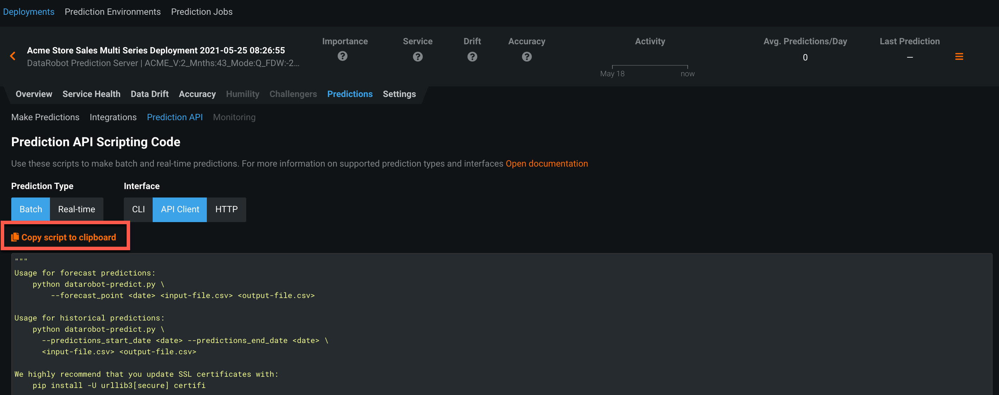

In [135]:
from IPython import display
display.Image("./Prediction_Script.png")

### The cell below contains the Python command to get predictions in Batch mode from the deployed model on the Prediction Server. 
Make sure to set the forecast point. This is the last date that the Target is populated for. 

In [198]:
%%time

!python datarobot-predict.py --forecast_point "2018-11-16" data/Acme_Test_Cluster_0.csv Cluster_0_predictions.csv

2021-06-10 08:18:49,476 datarobot-predict.py:90 INFO Creating Batch Prediction job for deployment ID 60c11a57bc126a9e15ece2ea
2021-06-10 08:19:22,720 datarobot-predict.py:123 INFO Finished Batch Prediction job ID 60c2113ac2aef4af2c218afe for deployment ID 60c11a57bc126a9e15ece2ea. Results downloaded to Cluster_0_predictions.csv.
CPU times: user 711 ms, sys: 265 ms, total: 977 ms
Wall time: 34.4 s


### Read in the Prediction file from the Deployment Server

In [199]:
preds = pd.read_csv('Cluster_0_predictions.csv', 
                    infer_datetime_format=True,
                    parse_dates=['FORECAST_POINT', 'Date']
                    )

preds.head(5)

,Series,FORECAST_POINT,Date,FORECAST_DISTANCE,SalesQty (actual)_PREDICTION,EXPLANATION_1_FEATURE_NAME,EXPLANATION_1_STRENGTH,EXPLANATION_1_ACTUAL_VALUE,EXPLANATION_1_QUALITATIVE_STRENGTH,EXPLANATION_2_FEATURE_NAME,EXPLANATION_2_STRENGTH,EXPLANATION_2_ACTUAL_VALUE,EXPLANATION_2_QUALITATIVE_STRENGTH,EXPLANATION_3_FEATURE_NAME,EXPLANATION_3_STRENGTH,EXPLANATION_3_ACTUAL_VALUE,EXPLANATION_3_QUALITATIVE_STRENGTH,DEPLOYMENT_APPROVAL_STATUS,PREDICTION_85_PERCENTILE_LOW,PREDICTION_85_PERCENTILE_HIGH
0,01053_Alcohol_3633522291,2018-11-16,2018-11-17,1,3.69103,SalesQty (7 day mean),-17.49522,1.28571,---,SalesQty (7 day median),-15.28814,0.0,---,SalesQty (naive latest value),-6.23734,3.0,--,APPROVED,0.47841,6.14793
1,01053_Alcohol_3633522291,2018-11-16,2018-11-18,2,3.83318,SalesQty (7 day median),-24.76728,0.00000,---,SalesQty (7 day mean),-18.77639,1.28571428571,---,SalesQty (naive latest value),-7.17425,3.0,--,APPROVED,0.59759,6.31103
2,01053_Alcohol_3633522291,2018-11-16,2018-11-19,3,3.45923,SalesQty (7 day mean),-16.67129,1.28571,---,SalesQty (7 day median),-5.25844,0.0,--,SalesQty (14 day median),-4.65901,1.0,--,APPROVED,0.21665,5.92187
3,01053_Alcohol_3633522291,2018-11-16,2018-11-20,4,2.57798,SalesQty (7 day mean),-17.32528,1.28571,---,SalesQty (7 day median),-4.84710,0.0,--,SalesQty (14 day median),-4.55620,1.0,--,APPROVED,-0.55875,5.00040
4,01053_Alcohol_3633522291,2018-11-16,2018-11-21,5,2.57798,SalesQty (7 day mean),-17.32528,1.28571,---,SalesQty (7 day median),-4.84710,0.0,--,SalesQty (14 day median),-4.55620,1.0,--,APPROVED,-0.60271,4.96715


### Turn off Prediction Intervals and Prediction Explanations and get Predictions

In [200]:
dr.Deployment.update_prediction_intervals_settings(deployment, enabled=False, percentiles=None)

In [201]:
# Verify change
dr.Deployment.get_prediction_intervals_settings(deployment)

{'percentiles': [], 'enabled': False}

In [202]:
%%time

!python datarobot-predict.py --forecast_point "2018-11-16" data/Acme_Test_Cluster_0.csv Cluster_0_predictions.csv

2021-06-10 08:19:37,924 datarobot-predict.py:90 INFO Creating Batch Prediction job for deployment ID 60c11a57bc126a9e15ece2ea
2021-06-10 08:20:08,305 datarobot-predict.py:123 INFO Finished Batch Prediction job ID 60c2116a5a634c8f01a79be6 for deployment ID 60c11a57bc126a9e15ece2ea. Results downloaded to Cluster_0_predictions.csv.
CPU times: user 783 ms, sys: 283 ms, total: 1.07 s
Wall time: 31.1 s


#### Note the speed increase in turning off intervals and explanations
34 Seconds with, and 31 seconds without

# Delete the deployment

## Verify its the Correct deployment BEFORE deleting
There is NO undoing this deletion <br>
This is just like deleting a file on a Linux computer. Once its deleted, its gone for good. 

In [232]:
deployment = Deployment.get(deployment_id=DEPLOYMENT_ID)

print('Deployment Name is: ', deployment.label)
print('Deployment ID is:    ' + str(DEPLOYMENT_ID))

In [204]:
# Delete the deployment
deployment.delete()

In [208]:
# Verify deployment was deleted
dr.Deployment.list(order_by=None, search=['Acme'])

[]

# Section 8 - Delete Project(s)
The snippet below will delete all projects created in this notebook. <br>
This is for Demo purposes only. <br>
If you want to delete projects make sure you select the correct ones. <br>
There is no harm in leaving unused projects in your workspace. <br>
Once you delete a project the closest way to get it back is to re-run it with the same data and settings. 

In [209]:
remove_projects = dr.Project.list(search_params={'project_name': BASE}) 
remove_projects

[Project(ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:2),
 Project(ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:1),
 Project(ACME_V:3_Mnths:36_Mode:Q_FDW:-35-0_FD:1-7_Clus:0),
 Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:2),
 Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:1),
 Project(ACME_V:2_Mnths:41_Mode:Q_FDW:-28-0_FD:1-7_Clus:0),
 Project(ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:2),
 Project(ACME_V:1_Mnths:41_Mode:Q_FDW:-35-0_FD:1-7_Clus:1)]

In [214]:
for p in remove_projects:
    project = Project.get(p.id)
    project.delete()
    remove_projects.remove(project)
    
remove_projects

[]

### Verify projects were successfully deleted

In [215]:
dr.Project.list(search_params={'project_name': BASE}) 

[]